# Testing different ML models to predict gene set scores from surface protein data

In this notebook different reggressors (RandomForestRegressor, GradientBoostingReggressor, CatBoostRegressor) are tested to predict gene set scores from CLR tranformed surface protein data. 

5 common clusters were found in Melsen and Yang (+Crinier) datasets; 

1. Proliferating NK cells
2. CD56dim GZMK-
3. CD56dim GZMK+ 
4. CD56bright
5. lymhoid tissue-resident NK cells (lt-NK)

Here, gene set for proliferating NK cells is explored. 


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import anndata as ad
import scvi
import scanpy as sc
import seaborn as sb


from sklearn.model_selection import train_test_split 
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score



Global seed set to 0
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [4]:
#markers

#Proliferating
prolif = ['S100A4', 'S100A6', 'KLRC2', 'IL32', 'GZMH', 'GNLY']

#CD56dim GZMK-
cd56dim_gzmk_neg= ['S100A4', 'S100A6', 'ACTB', 'ACTG1', 'CORO1A', 'PFN1', 'GZMB'] #lower expression of GZMB in gzmk_pos cluster, so marker added in this gene set

#CD56dim GZMK+
cd56dim_gzmk_pos = ['GZMK', 'SELL']

#CD56bright
cd56bright= ['NCAM1', 'KIT', 'SELL', 'CD2', 'IL7R', 'KLRC1']
#cd56bright_prot= ['CD56', 'CD62L', "CD2_prot", 'CD127']  #CD117 ab not used in this dataset

#lt-NK
lt_nk= ['CCL3', 'CCL4', 'XCL1', 'GZMK', 'CD160', 'DUSP2', 'CXCR4', 'BTG1']


In [5]:
#loading Neurips dataset
adata_neurips = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad')

In [6]:
adata_neurips

AnnData object with n_obs × n_vars = 80998 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [7]:
adata_neurips.obs['Site'].unique().tolist()

['site4', 'site3', 'site1', 'site2']

In [8]:
#selecting only sites 1 and 4 (good ab signals), from Neurips dataset

eg=adata_neurips[(adata_neurips.obs['Site'] == "site4") | (adata_neurips.obs['Site'] == "site1")].copy() 

In [9]:
eg.obs['Site'].unique().tolist()

['site4', 'site1']

In [10]:
prot=eg.obsm['protein_expression_clr_neurips']

In [11]:
prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,HLA-E,CD82,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15
GTAGTACCAATCCTTT-1-s4d1,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,0.694828,...,1.532575,0.614600,0.900688,1.389844,0.918109,0.0,0.0,0.0,0.0,0.0
CTCAAGAGTCACAGAG-1-s4d1,0.652674,1.069339,1.657770,0.890243,1.377072,1.264995,1.863027,1.101769,1.562259,1.072649,...,1.283465,0.614600,1.786480,0.762359,1.112478,0.0,0.0,0.0,0.0,0.0
CTGTGGGTCATGCGGC-1-s4d1,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,1.013739,...,1.344431,0.353792,0.860303,0.979461,1.147198,0.0,0.0,0.0,0.0,0.0
CGTGATAGTTATCTGG-1-s4d1,0.000000,1.249182,1.335424,1.256332,2.674106,1.322314,0.289336,1.240123,1.397398,1.525053,...,0.859205,1.527772,0.629556,0.854928,1.000442,0.0,0.0,0.0,0.0,0.0
AGATCCAAGATCGGTG-1-s4d1,2.784459,1.132949,1.674846,1.669058,1.663981,2.101246,2.112640,1.417276,1.884321,1.861734,...,1.429432,1.031029,2.808629,2.007436,2.064066,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GTGGTTAGTCGAGTTT-1-s1d3,0.000000,0.175083,0.734526,0.000000,0.505917,1.235054,1.241451,0.512721,0.502246,1.766372,...,0.374154,0.425643,0.519947,0.484666,0.497623,0.0,0.0,0.0,0.0,0.0
GCTACAACAGTGCGCT-1-s1d3,0.378666,0.453643,0.894450,0.000000,0.766577,1.058199,1.529611,0.512721,0.663922,1.766372,...,1.074485,0.100854,1.415230,0.854928,0.560915,0.0,0.0,0.0,0.0,0.0
AACAAAGGTTGGTACT-1-s1d3,0.378666,0.324031,1.094684,0.306698,0.401377,1.983838,2.156735,0.512721,0.835018,2.400949,...,1.149104,1.324148,1.315806,0.605141,0.357584,0.0,0.0,0.0,0.0,0.0
TGACAGTCATGGCTGC-1-s1d3,0.378666,0.764571,0.776968,0.306698,0.152401,1.358780,1.753042,0.201533,0.586348,1.543085,...,1.373575,0.276377,1.113769,0.660339,0.960123,0.0,0.0,0.0,0.0,0.0


In [12]:
prot=prot.rename(columns={'CD2': 'CD2_prot', 'CD83': 'CD83_prot', 'HLA-E': 'HLA-E_prot', 'CX3CR1': 'CX3CR1_prot', 'CD52': 'CD52_prot','CD69': 'CD69_prot', 'CD226':'CD226_prot', 'CD47': 'CD47_prot', 'TIGIT':'TIGIT_prot', 'CD27':'CD27_prot', 'CD38': 'CD38_prot', 'CD224': 'CD224_prot', 'CD7': 'CD7_prot', 'CD44': 'CD44_prot', 'CD34': 'CD34_prot','CD5': 'CD5_prot'})

In [13]:
#some proteins and genes have same names, here _prot added after protein names

a = eg.obs
b = prot

adata_eg=pd.concat([a, b], axis=1)
eg.obs=adata_eg

In [14]:
eg

AnnData object with n_obs × n_vars = 28418 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47_prot', 'CD48', 'CD40', 'CD154', 'CD52_prot', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD1

In [15]:
#selecting only NK cells, gd T cells and ILCs using Neurips annotations

eg_nk = eg[(eg.obs['cell_type'] == "NK") | (eg.obs['cell_type'] == "NK CD158e1+")].copy()   


In [16]:
eg_nk.obs['cell_type'].unique().tolist()

['NK', 'NK CD158e1+']

In [17]:
#This includes now selected cells (NK, ILC, gd T) from site 1 and 4
eg_nk

AnnData object with n_obs × n_vars = 2640 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47_prot', 'CD48', 'CD40', 'CD154', 'CD52_prot', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD16

## Calculating gene scores for gene sets

In [20]:
markers = prolif

In [21]:
markers

['S100A4', 'S100A6', 'KLRC2', 'IL32', 'GZMH', 'GNLY']

In [22]:
#calculating scores for gene set

sc.tl.score_genes(eg_nk, markers, score_name = 'marker_score')

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


In [23]:
eg_nk.obs['marker_score']

GTAGTACCAATCCTTT-1-s4d1    0.242802
CTGTGGGTCATGCGGC-1-s4d1    0.746696
GCAACATTCGCAAGAG-1-s4d1    0.070373
TCACGGGTCGCACGAC-1-s4d1    0.850457
CGCCAGAAGACCATTC-1-s4d1    1.754267
                             ...   
ATCATTCGTCCAATCA-1-s1d3    0.191326
ACATTTCCAGCAGTGA-1-s1d3    0.621183
TGAGACTTCCTTCAGC-1-s1d3    0.715489
GAGATGGTCCGCCTAT-1-s1d3    0.469420
ACCTGTCTCACAGTGT-1-s1d3    0.902909
Name: marker_score, Length: 2640, dtype: float64

In [24]:
prot = eg_nk.obsm['protein_expression_clr_neurips']

In [25]:
prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,HLA-E,CD82,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15
GTAGTACCAATCCTTT-1-s4d1,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,0.694828,...,1.532575,0.614600,0.900688,1.389844,0.918109,0.0,0.0,0.0,0.0,0.0
CTGTGGGTCATGCGGC-1-s4d1,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,1.013739,...,1.344431,0.353792,0.860303,0.979461,1.147198,0.0,0.0,0.0,0.0,0.0
GCAACATTCGCAAGAG-1-s4d1,0.378666,1.192753,1.208881,0.000000,1.456877,1.046035,1.333993,0.638218,1.360894,1.072649,...,1.218539,0.670407,0.329073,1.280509,0.676616,0.0,0.0,0.0,0.0,0.0
TCACGGGTCGCACGAC-1-s4d1,0.000000,0.849902,1.548700,0.730824,1.530781,1.883102,1.686271,1.240123,1.804089,0.812797,...,1.456232,0.614600,0.576253,1.189870,1.000442,0.0,0.0,0.0,0.0,0.0
CGCCAGAAGACCATTC-1-s4d1,0.652674,1.249182,1.404314,0.306698,1.417770,1.664855,1.409627,1.302726,1.663363,0.849218,...,1.556781,0.276377,0.680162,1.415407,0.729806,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCATTCGTCCAATCA-1-s1d3,0.000000,0.568367,1.124479,1.027708,0.600556,2.007513,1.679342,0.749707,0.545181,0.288523,...,1.556781,0.353792,0.519947,0.809714,0.357584,0.0,0.0,0.0,0.0,0.0
ACATTTCCAGCAGTGA-1-s1d3,0.000000,0.671273,0.856802,0.000000,0.284617,1.105431,0.818721,0.201533,0.309292,0.652195,...,0.950948,0.555495,0.519947,0.546717,0.194691,0.0,0.0,0.0,0.0,0.0
TGAGACTTCCTTCAGC-1-s1d3,0.000000,0.671273,0.734526,0.306698,0.284617,1.255114,1.174628,0.749707,0.625887,0.406586,...,0.374154,0.492675,0.396827,0.418509,0.000000,0.0,0.0,0.0,0.0,0.0
GAGATGGTCCGCCTAT-1-s1d3,0.000000,0.928521,0.999570,0.541080,0.600556,1.759143,2.420602,1.024682,0.700563,0.406586,...,1.532575,0.555495,0.576253,0.546717,0.430053,0.0,0.0,0.0,0.0,0.0


In [26]:
#dropping columns containing only zeros

prot = prot.loc[:, (prot!=0).any(axis=0)]

In [27]:
prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD94,CD162,CD85j,CD23,CD328,HLA-E,CD82,CD101,CD88,CD224
GTAGTACCAATCCTTT-1-s4d1,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,0.694828,...,2.475005,1.804603,1.069921,1.496785,2.696518,1.532575,0.614600,0.900688,1.389844,0.918109
CTGTGGGTCATGCGGC-1-s4d1,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,1.013739,...,1.408073,1.772872,0.890506,1.188863,2.678422,1.344431,0.353792,0.860303,0.979461,1.147198
GCAACATTCGCAAGAG-1-s4d1,0.378666,1.192753,1.208881,0.000000,1.456877,1.046035,1.333993,0.638218,1.360894,1.072649,...,2.174035,1.013704,1.148843,1.332566,0.000000,1.218539,0.670407,0.329073,1.280509,0.676616
TCACGGGTCGCACGAC-1-s4d1,0.000000,0.849902,1.548700,0.730824,1.530781,1.883102,1.686271,1.240123,1.804089,0.812797,...,3.016060,1.587440,1.623280,1.552023,2.164676,1.456232,0.614600,0.576253,1.189870,1.000442
CGCCAGAAGACCATTC-1-s4d1,0.652674,1.249182,1.404314,0.306698,1.417770,1.664855,1.409627,1.302726,1.663363,0.849218,...,2.826218,2.465725,1.524077,1.637802,3.066941,1.556781,0.276377,0.680162,1.415407,0.729806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCATTCGTCCAATCA-1-s1d3,0.000000,0.568367,1.124479,1.027708,0.600556,2.007513,1.679342,0.749707,0.545181,0.288523,...,4.481286,2.345961,0.391222,0.700530,4.391692,1.556781,0.353792,0.519947,0.809714,0.357584
ACATTTCCAGCAGTGA-1-s1d3,0.000000,0.671273,0.856802,0.000000,0.284617,1.105431,0.818721,0.201533,0.309292,0.652195,...,2.122566,1.496074,0.391222,0.410393,2.678422,0.950948,0.555495,0.519947,0.546717,0.194691
TGAGACTTCCTTCAGC-1-s1d3,0.000000,0.671273,0.734526,0.306698,0.284617,1.255114,1.174628,0.749707,0.625887,0.406586,...,0.365443,1.296756,0.214622,0.410393,3.910620,0.374154,0.492675,0.396827,0.418509,0.000000
GAGATGGTCCGCCTAT-1-s1d3,0.000000,0.928521,0.999570,0.541080,0.600556,1.759143,2.420602,1.024682,0.700563,0.406586,...,2.986818,1.976363,0.214622,0.990050,1.800479,1.532575,0.555495,0.576253,0.546717,0.430053


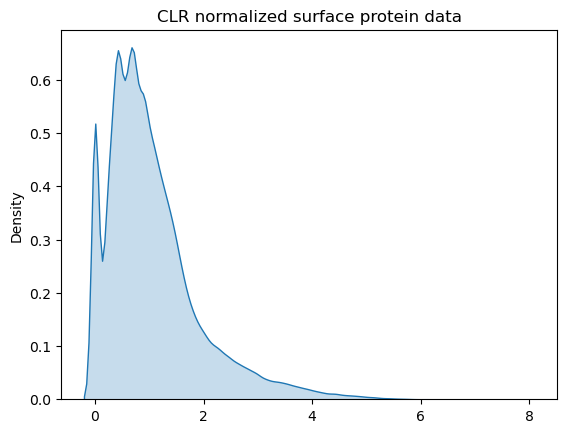

In [28]:
flatten_df = prot.to_numpy().flatten()

sb.kdeplot(flatten_df, fill = True) ; 


plt.title("CLR normalized surface protein data") ;

In [31]:
score = eg_nk.obs['marker_score']

In [32]:
score

GTAGTACCAATCCTTT-1-s4d1    0.242802
CTGTGGGTCATGCGGC-1-s4d1    0.746696
GCAACATTCGCAAGAG-1-s4d1    0.070373
TCACGGGTCGCACGAC-1-s4d1    0.850457
CGCCAGAAGACCATTC-1-s4d1    1.754267
                             ...   
ATCATTCGTCCAATCA-1-s1d3    0.191326
ACATTTCCAGCAGTGA-1-s1d3    0.621183
TGAGACTTCCTTCAGC-1-s1d3    0.715489
GAGATGGTCCGCCTAT-1-s1d3    0.469420
ACCTGTCTCACAGTGT-1-s1d3    0.902909
Name: marker_score, Length: 2640, dtype: float64

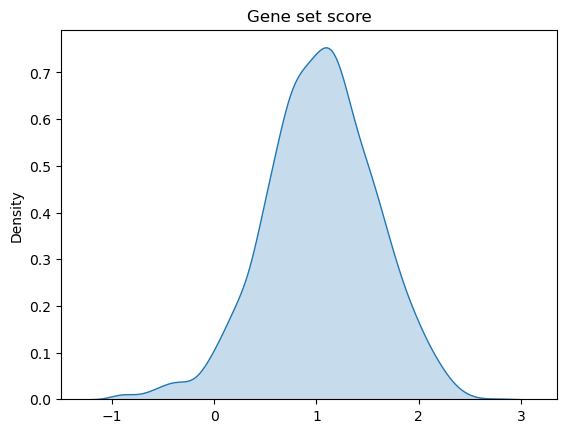

In [33]:
flatten_df1 = score.to_numpy().flatten()

sb.kdeplot(flatten_df1, fill = True) ; 

plt.title("Gene set score") ;

In [34]:
#Creating df containign surface protein data + scores for gene sets

a = score
b = prot

df =pd.concat([a, b], axis=1)


In [35]:
df

,marker_score,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,...,CD94,CD162,CD85j,CD23,CD328,HLA-E,CD82,CD101,CD88,CD224
GTAGTACCAATCCTTT-1-s4d1,0.242802,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,...,2.475005,1.804603,1.069921,1.496785,2.696518,1.532575,0.614600,0.900688,1.389844,0.918109
CTGTGGGTCATGCGGC-1-s4d1,0.746696,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,...,1.408073,1.772872,0.890506,1.188863,2.678422,1.344431,0.353792,0.860303,0.979461,1.147198
GCAACATTCGCAAGAG-1-s4d1,0.070373,0.378666,1.192753,1.208881,0.000000,1.456877,1.046035,1.333993,0.638218,1.360894,...,2.174035,1.013704,1.148843,1.332566,0.000000,1.218539,0.670407,0.329073,1.280509,0.676616
TCACGGGTCGCACGAC-1-s4d1,0.850457,0.000000,0.849902,1.548700,0.730824,1.530781,1.883102,1.686271,1.240123,1.804089,...,3.016060,1.587440,1.623280,1.552023,2.164676,1.456232,0.614600,0.576253,1.189870,1.000442
CGCCAGAAGACCATTC-1-s4d1,1.754267,0.652674,1.249182,1.404314,0.306698,1.417770,1.664855,1.409627,1.302726,1.663363,...,2.826218,2.465725,1.524077,1.637802,3.066941,1.556781,0.276377,0.680162,1.415407,0.729806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCATTCGTCCAATCA-1-s1d3,0.191326,0.000000,0.568367,1.124479,1.027708,0.600556,2.007513,1.679342,0.749707,0.545181,...,4.481286,2.345961,0.391222,0.700530,4.391692,1.556781,0.353792,0.519947,0.809714,0.357584
ACATTTCCAGCAGTGA-1-s1d3,0.621183,0.000000,0.671273,0.856802,0.000000,0.284617,1.105431,0.818721,0.201533,0.309292,...,2.122566,1.496074,0.391222,0.410393,2.678422,0.950948,0.555495,0.519947,0.546717,0.194691
TGAGACTTCCTTCAGC-1-s1d3,0.715489,0.000000,0.671273,0.734526,0.306698,0.284617,1.255114,1.174628,0.749707,0.625887,...,0.365443,1.296756,0.214622,0.410393,3.910620,0.374154,0.492675,0.396827,0.418509,0.000000
GAGATGGTCCGCCTAT-1-s1d3,0.469420,0.000000,0.928521,0.999570,0.541080,0.600556,1.759143,2.420602,1.024682,0.700563,...,2.986818,1.976363,0.214622,0.990050,1.800479,1.532575,0.555495,0.576253,0.546717,0.430053


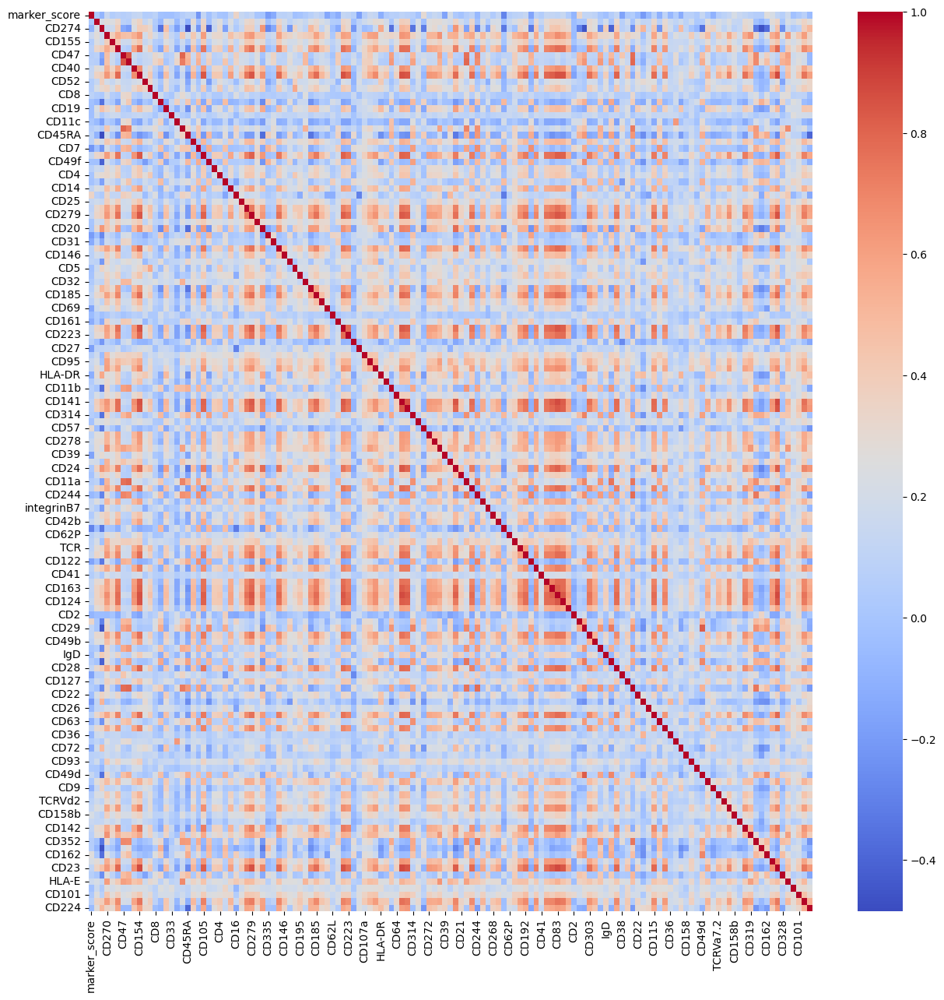

In [36]:
plt.figure(figsize=(15,15))
sb.heatmap(data=df.corr(),cmap='coolwarm')
plt.show()

In [33]:
df

,marker_score,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,...,CD94,CD162,CD85j,CD23,CD328,HLA-E,CD82,CD101,CD88,CD224
GTAGTACCAATCCTTT-1-s4d1,0.242802,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,...,2.475005,1.804603,1.069921,1.496785,2.696518,1.532575,0.614600,0.900688,1.389844,0.918109
CTGTGGGTCATGCGGC-1-s4d1,0.746696,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,...,1.408073,1.772872,0.890506,1.188863,2.678422,1.344431,0.353792,0.860303,0.979461,1.147198
GCAACATTCGCAAGAG-1-s4d1,0.070373,0.378666,1.192753,1.208881,0.000000,1.456877,1.046035,1.333993,0.638218,1.360894,...,2.174035,1.013704,1.148843,1.332566,0.000000,1.218539,0.670407,0.329073,1.280509,0.676616
TCACGGGTCGCACGAC-1-s4d1,0.850457,0.000000,0.849902,1.548700,0.730824,1.530781,1.883102,1.686271,1.240123,1.804089,...,3.016060,1.587440,1.623280,1.552023,2.164676,1.456232,0.614600,0.576253,1.189870,1.000442
CGCCAGAAGACCATTC-1-s4d1,1.754267,0.652674,1.249182,1.404314,0.306698,1.417770,1.664855,1.409627,1.302726,1.663363,...,2.826218,2.465725,1.524077,1.637802,3.066941,1.556781,0.276377,0.680162,1.415407,0.729806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCATTCGTCCAATCA-1-s1d3,0.191326,0.000000,0.568367,1.124479,1.027708,0.600556,2.007513,1.679342,0.749707,0.545181,...,4.481286,2.345961,0.391222,0.700530,4.391692,1.556781,0.353792,0.519947,0.809714,0.357584
ACATTTCCAGCAGTGA-1-s1d3,0.621183,0.000000,0.671273,0.856802,0.000000,0.284617,1.105431,0.818721,0.201533,0.309292,...,2.122566,1.496074,0.391222,0.410393,2.678422,0.950948,0.555495,0.519947,0.546717,0.194691
TGAGACTTCCTTCAGC-1-s1d3,0.715489,0.000000,0.671273,0.734526,0.306698,0.284617,1.255114,1.174628,0.749707,0.625887,...,0.365443,1.296756,0.214622,0.410393,3.910620,0.374154,0.492675,0.396827,0.418509,0.000000
GAGATGGTCCGCCTAT-1-s1d3,0.469420,0.000000,0.928521,0.999570,0.541080,0.600556,1.759143,2.420602,1.024682,0.700563,...,2.986818,1.976363,0.214622,0.990050,1.800479,1.532575,0.555495,0.576253,0.546717,0.430053


## 1. RandomForestRegressor

In [34]:
#Random forest

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params = {#'bootstrap': [True, False],
 'max_depth': [3,5,7],
 #'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'],
 'min_samples_leaf': [2, 5, 10],
 #'min_samples_split': [2, 5, 10] ,
 #'n_estimators': [10, 50, 100]
}


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(RandomForestRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model = result.best_estimator_
y_pred = best_model.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)
    

Mean squared error: 0.18 R2 score: 0.39


In [35]:
#Mean training scores

print(mean_train_score)

[array([-0.19025049, -0.19006981, -0.19039056, -0.14929676, -0.15033808,
       -0.15382332, -0.10702201, -0.11120985, -0.12094219])]


In [36]:
# The best score and parameters

print(result.best_score_)
print(result.best_params_)

-0.18478329205251182
{'max_depth': 7, 'min_samples_leaf': 10}


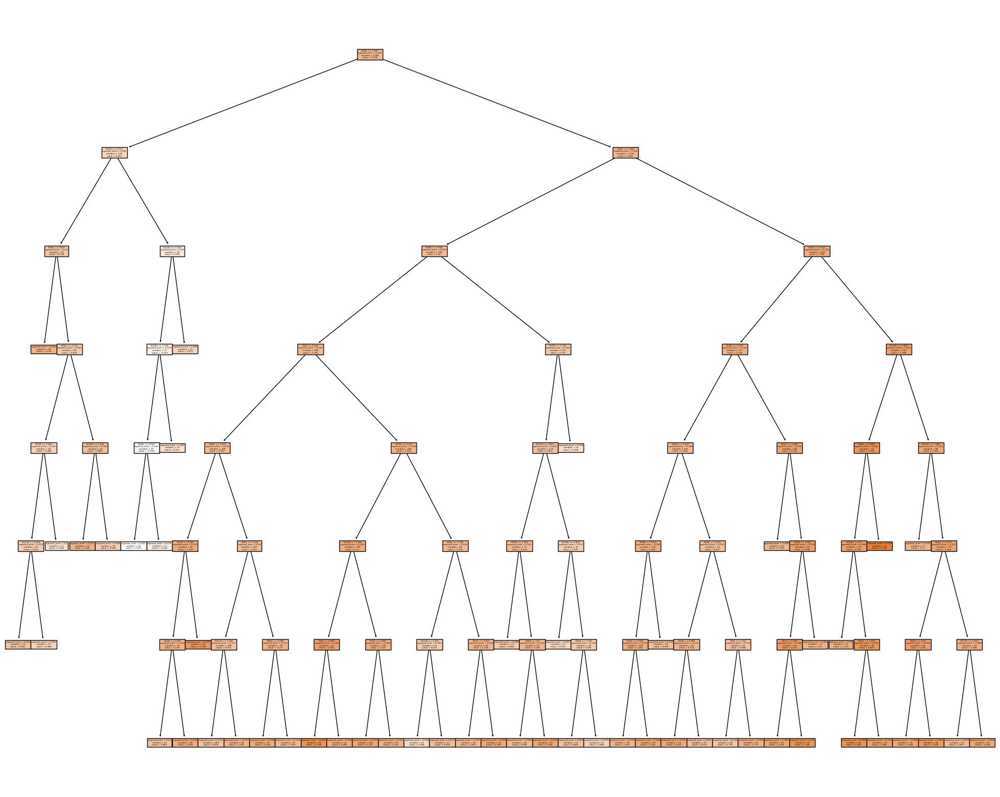

In [37]:
from sklearn import tree

plt.figure(figsize=(25, 20)) # Resize figure
tree.plot_tree(best_model.estimators_[0], filled = True) ;

plt.show()

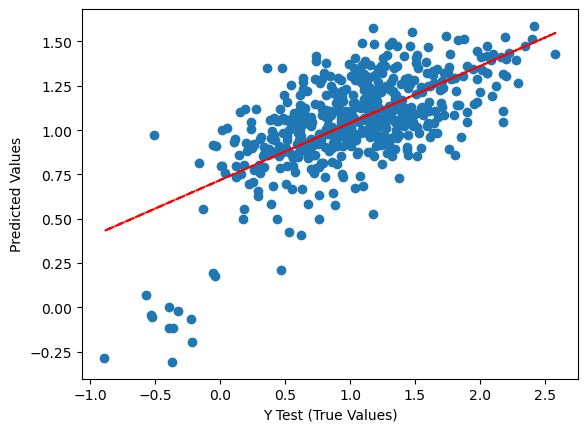

In [38]:
plt.scatter(y_test, y_pred)

# Add a trendline
z = np.polyfit(y_test, y_pred, 1)
p = np.poly1d(z)
plt.plot(y_test, p(y_test), 'r--')
# Add labels
plt.xlabel('Y Test (True Values)')
plt.ylabel('Predicted Values')
plt.show()

<AxesSubplot: xlabel='marker_score', ylabel='Density'>

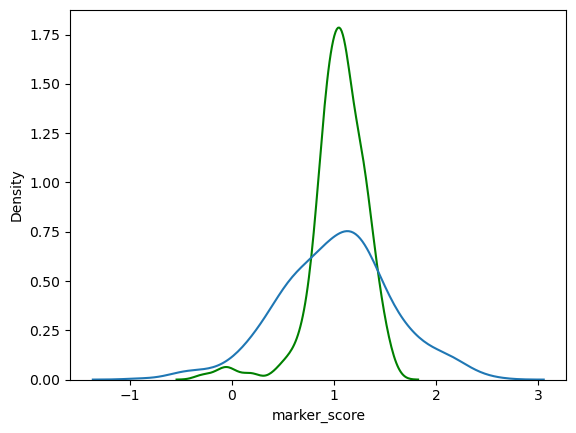

In [39]:
sb.kdeplot(y_pred, color = "g") #predicted values
sb.kdeplot(y_test) #observed values

In [40]:
#Feature importances

importances_rf = best_model.feature_importances_
importances_rf = pd.Series(importances_rf, index=prot.columns)
importances_rf=importances_rf.sort_values(ascending=False)

print(importances_rf.head(10))

CD16     0.172907
CD226    0.106226
CD57     0.078772
CD162    0.055353
CD7      0.049828
CD54     0.047743
CD122    0.046771
CD38     0.035965
CD69     0.029062
CD85j    0.018309
dtype: float64


In [41]:
#df from the top 20 important markers
importances_rf=pd.DataFrame(importances_rf)
importances_rf_top=importances_rf[0:20]
importances_rf_top=importances_rf_top.T

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


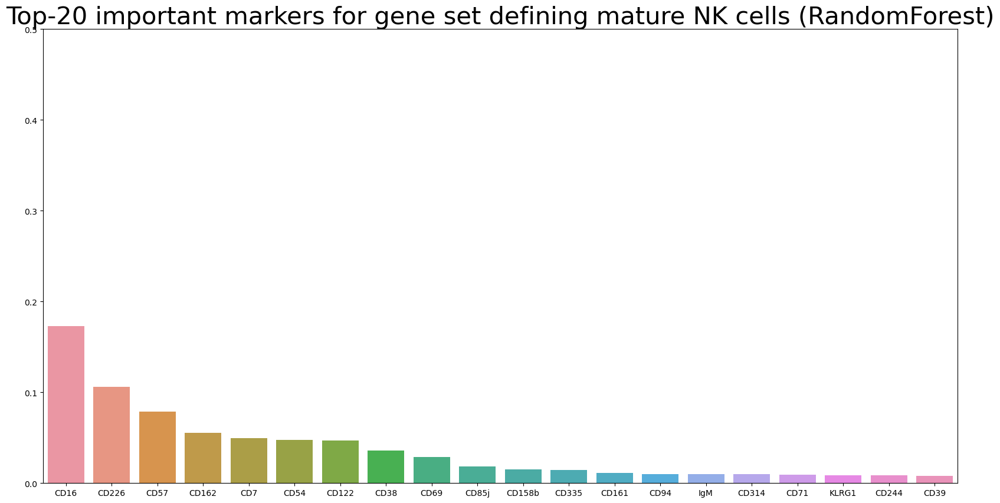

In [42]:
plt.figure(figsize=(20,10))
plt.ylim(0,0.5)
a=sb.barplot(data=importances_rf_top)

plt.title("Top-20 important markers for gene set defining mature NK cells (RandomForest)", fontsize = 30) ;


## 2. Dummy Reggressor

In [43]:
from sklearn.dummy import DummyRegressor

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params =  {'strategy': ["mean", "median"]}


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(DummyRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model_dummy = result.best_estimator_
y_pred = best_model_dummy.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)

Mean squared error: 0.30 R2 score: -0.00


In [44]:
print(mean_train_score)

[array([-0.28563765, -0.28576369])]


## 3. GragientBoostingRegressor

In [37]:
#Gradient boosting regressor

from sklearn.ensemble import GradientBoostingRegressor

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params =  {'max_depth': [3,5,7],
          'min_samples_leaf': [2, 5, 10]}


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(GradientBoostingRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model_gbr = result.best_estimator_
y_pred = best_model_gbr.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)

Mean squared error: 0.18 R2 score: 0.41


In [38]:
print(mean_train_score)

[array([-0.09716552, -0.09686602, -0.09814194, -0.02880892, -0.02939992,
       -0.03383647, -0.00311122, -0.00383898, -0.00726726])]


<AxesSubplot: xlabel='marker_score', ylabel='Density'>

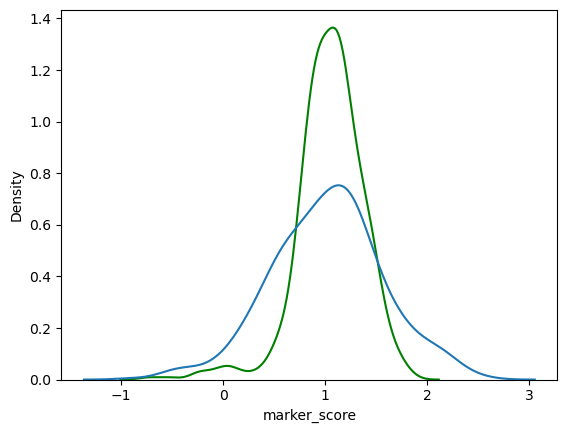

In [39]:
sb.kdeplot(y_pred, color = "g")
sb.kdeplot(y_test)

In [40]:
importances_gbr = best_model_gbr.feature_importances_
importances_gbr = pd.Series(importances_gbr, index=prot.columns)
importances_gbr=importances_gbr.sort_values(ascending=False)

print(importances_gbr.head(10))

CD16      0.129937
CD226     0.103503
CD57      0.077343
CD54      0.063663
CD38      0.053882
CD162     0.050771
CD7       0.050290
CD122     0.047301
CD85j     0.025185
CD158b    0.022099
dtype: float64


In [41]:
#df from the top 20 important markers
importances_gbr=pd.DataFrame(importances_gbr)
importances_gbr_top=importances_gbr[0:20]
importances_gbr_top=importances_gbr_top.T

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


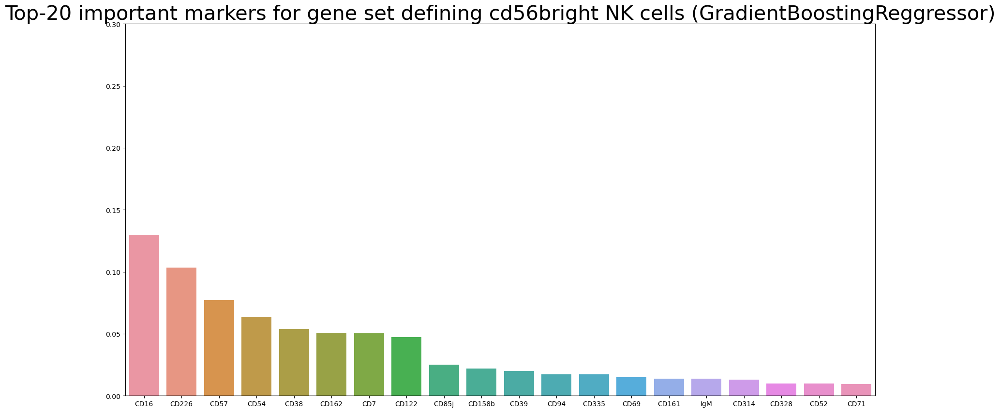

In [42]:
plt.figure(figsize=(20,10))
plt.ylim(0,0.3)
a=sb.barplot(data=importances_gbr_top)

plt.title("Top-20 important markers for gene set defining proliferating NK cells (GradientBoostingReggressor)", fontsize = 30) ;



## 4. CatBoostRegressor

In [52]:
from catboost import CatBoostRegressor

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params= {'depth': [6,8,10],
        'learning_rate' : [0.01, 0.05, 0.1],
        'iterations'    : [30, 50, 100]
                 }

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(CatBoostRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model_cb = result.best_estimator_
y_pred = best_model_cb.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)

0:	learn: 0.5321689	total: 63.4ms	remaining: 1.84s
1:	learn: 0.5311867	total: 66.5ms	remaining: 931ms
2:	learn: 0.5301032	total: 69.1ms	remaining: 622ms
3:	learn: 0.5289478	total: 71.7ms	remaining: 466ms
4:	learn: 0.5279026	total: 74.3ms	remaining: 371ms
5:	learn: 0.5269878	total: 76.5ms	remaining: 306ms
6:	learn: 0.5257086	total: 79ms	remaining: 260ms
7:	learn: 0.5246764	total: 81.3ms	remaining: 224ms
8:	learn: 0.5235804	total: 83.6ms	remaining: 195ms
9:	learn: 0.5225053	total: 86.7ms	remaining: 173ms
10:	learn: 0.5214102	total: 89.1ms	remaining: 154ms
11:	learn: 0.5204830	total: 91.4ms	remaining: 137ms
12:	learn: 0.5195134	total: 93.6ms	remaining: 122ms
13:	learn: 0.5186496	total: 96.8ms	remaining: 111ms
14:	learn: 0.5176869	total: 99.9ms	remaining: 99.9ms
15:	learn: 0.5167708	total: 102ms	remaining: 89.6ms
16:	learn: 0.5156989	total: 106ms	remaining: 80.7ms
17:	learn: 0.5146899	total: 109ms	remaining: 72.4ms
18:	learn: 0.5137132	total: 112ms	remaining: 64.7ms
19:	learn: 0.5127654	to

6:	learn: 0.5294119	total: 18.2ms	remaining: 59.7ms
7:	learn: 0.5284915	total: 20.7ms	remaining: 56.9ms
8:	learn: 0.5275495	total: 23ms	remaining: 53.7ms
9:	learn: 0.5265874	total: 25.4ms	remaining: 50.7ms
10:	learn: 0.5255565	total: 27.7ms	remaining: 47.8ms
11:	learn: 0.5244531	total: 30.8ms	remaining: 46.2ms
12:	learn: 0.5235810	total: 33.8ms	remaining: 44.2ms
13:	learn: 0.5228026	total: 36.7ms	remaining: 42ms
14:	learn: 0.5218214	total: 39.5ms	remaining: 39.5ms
15:	learn: 0.5208832	total: 42ms	remaining: 36.8ms
16:	learn: 0.5199343	total: 44.6ms	remaining: 34.1ms
17:	learn: 0.5189804	total: 47.3ms	remaining: 31.5ms
18:	learn: 0.5180888	total: 50.1ms	remaining: 29ms
19:	learn: 0.5172301	total: 54ms	remaining: 27ms
20:	learn: 0.5163139	total: 57ms	remaining: 24.4ms
21:	learn: 0.5153986	total: 59.6ms	remaining: 21.7ms
22:	learn: 0.5144227	total: 62.2ms	remaining: 18.9ms
23:	learn: 0.5134240	total: 64.8ms	remaining: 16.2ms
24:	learn: 0.5124611	total: 67.5ms	remaining: 13.5ms
25:	learn: 

12:	learn: 0.4806026	total: 33.4ms	remaining: 43.7ms
13:	learn: 0.4776954	total: 36.3ms	remaining: 41.5ms
14:	learn: 0.4741698	total: 39ms	remaining: 39ms
15:	learn: 0.4708112	total: 41.5ms	remaining: 36.3ms
16:	learn: 0.4676751	total: 44.5ms	remaining: 34ms
17:	learn: 0.4646759	total: 47.5ms	remaining: 31.7ms
18:	learn: 0.4622044	total: 50.8ms	remaining: 29.4ms
19:	learn: 0.4597760	total: 53.3ms	remaining: 26.6ms
20:	learn: 0.4577834	total: 55.7ms	remaining: 23.9ms
21:	learn: 0.4557859	total: 58.5ms	remaining: 21.3ms
22:	learn: 0.4527824	total: 61.1ms	remaining: 18.6ms
23:	learn: 0.4510455	total: 63.8ms	remaining: 15.9ms
24:	learn: 0.4488809	total: 67.2ms	remaining: 13.4ms
25:	learn: 0.4469097	total: 70.5ms	remaining: 10.8ms
26:	learn: 0.4451669	total: 73.6ms	remaining: 8.18ms
27:	learn: 0.4436853	total: 76.8ms	remaining: 5.49ms
28:	learn: 0.4423529	total: 80ms	remaining: 2.76ms
29:	learn: 0.4400818	total: 82.7ms	remaining: 0us
0:	learn: 0.5314058	total: 2.64ms	remaining: 76.5ms
1:	le

12:	learn: 0.4772082	total: 33.6ms	remaining: 43.9ms
13:	learn: 0.4745830	total: 36.3ms	remaining: 41.5ms
14:	learn: 0.4722506	total: 38.6ms	remaining: 38.6ms
15:	learn: 0.4691333	total: 41.4ms	remaining: 36.2ms
16:	learn: 0.4658416	total: 44.6ms	remaining: 34.1ms
17:	learn: 0.4632346	total: 47.6ms	remaining: 31.7ms
18:	learn: 0.4607117	total: 51.2ms	remaining: 29.6ms
19:	learn: 0.4577920	total: 53.7ms	remaining: 26.8ms
20:	learn: 0.4557272	total: 56.3ms	remaining: 24.1ms
21:	learn: 0.4537935	total: 59ms	remaining: 21.4ms
22:	learn: 0.4514624	total: 62ms	remaining: 18.9ms
23:	learn: 0.4492254	total: 64.6ms	remaining: 16.2ms
24:	learn: 0.4470995	total: 67.9ms	remaining: 13.6ms
25:	learn: 0.4447804	total: 71.1ms	remaining: 10.9ms
26:	learn: 0.4424284	total: 74.6ms	remaining: 8.29ms
27:	learn: 0.4410546	total: 77.5ms	remaining: 5.53ms
28:	learn: 0.4397199	total: 80.1ms	remaining: 2.76ms
29:	learn: 0.4379678	total: 83.3ms	remaining: 0us
0:	learn: 0.5283203	total: 3.13ms	remaining: 90.9ms
1

21:	learn: 0.4196842	total: 84.5ms	remaining: 30.7ms
22:	learn: 0.4172994	total: 88.3ms	remaining: 26.9ms
23:	learn: 0.4149445	total: 91.2ms	remaining: 22.8ms
24:	learn: 0.4128041	total: 94.8ms	remaining: 19ms
25:	learn: 0.4107590	total: 97.5ms	remaining: 15ms
26:	learn: 0.4090934	total: 101ms	remaining: 11.2ms
27:	learn: 0.4069296	total: 104ms	remaining: 7.41ms
28:	learn: 0.4055870	total: 107ms	remaining: 3.68ms
29:	learn: 0.4037243	total: 111ms	remaining: 0us
0:	learn: 0.5224140	total: 4.33ms	remaining: 126ms
1:	learn: 0.5136401	total: 7.33ms	remaining: 103ms
2:	learn: 0.5035012	total: 10.9ms	remaining: 97.9ms
3:	learn: 0.4960775	total: 13.7ms	remaining: 89.1ms
4:	learn: 0.4887398	total: 16.6ms	remaining: 83ms
5:	learn: 0.4817621	total: 20.1ms	remaining: 80.4ms
6:	learn: 0.4741997	total: 23.9ms	remaining: 78.5ms
7:	learn: 0.4700339	total: 26.8ms	remaining: 73.6ms
8:	learn: 0.4650749	total: 29.9ms	remaining: 69.8ms
9:	learn: 0.4610614	total: 33.8ms	remaining: 67.5ms
10:	learn: 0.45618

1:	learn: 0.5135301	total: 8.11ms	remaining: 114ms
2:	learn: 0.5034409	total: 11.9ms	remaining: 107ms
3:	learn: 0.4956757	total: 16.3ms	remaining: 106ms
4:	learn: 0.4881788	total: 19.2ms	remaining: 95.8ms
5:	learn: 0.4810172	total: 22ms	remaining: 88.1ms
6:	learn: 0.4741103	total: 25.6ms	remaining: 84.2ms
7:	learn: 0.4698474	total: 29.3ms	remaining: 80.5ms
8:	learn: 0.4650421	total: 33.1ms	remaining: 77.1ms
9:	learn: 0.4602675	total: 36.9ms	remaining: 73.8ms
10:	learn: 0.4550837	total: 39.6ms	remaining: 68.4ms
11:	learn: 0.4512281	total: 42.5ms	remaining: 63.7ms
12:	learn: 0.4478152	total: 46.5ms	remaining: 60.7ms
13:	learn: 0.4442450	total: 50.2ms	remaining: 57.3ms
14:	learn: 0.4410404	total: 54ms	remaining: 54ms
15:	learn: 0.4381933	total: 56.9ms	remaining: 49.8ms
16:	learn: 0.4345031	total: 59.8ms	remaining: 45.8ms
17:	learn: 0.4317778	total: 63.7ms	remaining: 42.4ms
18:	learn: 0.4289387	total: 67ms	remaining: 38.8ms
19:	learn: 0.4258418	total: 70.1ms	remaining: 35ms
20:	learn: 0.42

43:	learn: 0.4932153	total: 139ms	remaining: 19ms
44:	learn: 0.4924022	total: 143ms	remaining: 15.9ms
45:	learn: 0.4917685	total: 146ms	remaining: 12.7ms
46:	learn: 0.4910942	total: 150ms	remaining: 9.56ms
47:	learn: 0.4903928	total: 154ms	remaining: 6.42ms
48:	learn: 0.4897200	total: 157ms	remaining: 3.21ms
49:	learn: 0.4890757	total: 161ms	remaining: 0us
0:	learn: 0.5357769	total: 4.94ms	remaining: 242ms
1:	learn: 0.5347313	total: 8.98ms	remaining: 216ms
2:	learn: 0.5335105	total: 12.3ms	remaining: 192ms
3:	learn: 0.5324347	total: 15ms	remaining: 172ms
4:	learn: 0.5314573	total: 17.9ms	remaining: 161ms
5:	learn: 0.5304141	total: 20.9ms	remaining: 153ms
6:	learn: 0.5291642	total: 24.3ms	remaining: 149ms
7:	learn: 0.5282318	total: 27.1ms	remaining: 142ms
8:	learn: 0.5271417	total: 30.3ms	remaining: 138ms
9:	learn: 0.5259945	total: 34.4ms	remaining: 138ms
10:	learn: 0.5248988	total: 37.6ms	remaining: 133ms
11:	learn: 0.5238026	total: 40.6ms	remaining: 128ms
12:	learn: 0.5228861	total: 4

14:	learn: 0.5218214	total: 56.9ms	remaining: 133ms
15:	learn: 0.5208832	total: 60.6ms	remaining: 129ms
16:	learn: 0.5199343	total: 64.2ms	remaining: 125ms
17:	learn: 0.5189804	total: 67ms	remaining: 119ms
18:	learn: 0.5180888	total: 71.4ms	remaining: 116ms
19:	learn: 0.5172301	total: 75.4ms	remaining: 113ms
20:	learn: 0.5163139	total: 79.6ms	remaining: 110ms
21:	learn: 0.5153986	total: 82.8ms	remaining: 105ms
22:	learn: 0.5144227	total: 86.1ms	remaining: 101ms
23:	learn: 0.5134240	total: 89.3ms	remaining: 96.7ms
24:	learn: 0.5124611	total: 93.1ms	remaining: 93.1ms
25:	learn: 0.5115418	total: 96.3ms	remaining: 88.8ms
26:	learn: 0.5107055	total: 100ms	remaining: 85.4ms
27:	learn: 0.5099812	total: 103ms	remaining: 81.1ms
28:	learn: 0.5092125	total: 106ms	remaining: 77ms
29:	learn: 0.5083969	total: 110ms	remaining: 73.6ms
30:	learn: 0.5076230	total: 113ms	remaining: 69.5ms
31:	learn: 0.5067623	total: 116ms	remaining: 65.3ms
32:	learn: 0.5060401	total: 120ms	remaining: 61.6ms
33:	learn: 0.

43:	learn: 0.4940467	total: 165ms	remaining: 22.6ms
44:	learn: 0.4932510	total: 170ms	remaining: 18.8ms
45:	learn: 0.4925735	total: 173ms	remaining: 15ms
46:	learn: 0.4918839	total: 176ms	remaining: 11.2ms
47:	learn: 0.4911575	total: 179ms	remaining: 7.46ms
48:	learn: 0.4904378	total: 183ms	remaining: 3.73ms
49:	learn: 0.4896611	total: 186ms	remaining: 0us
0:	learn: 0.5273495	total: 4.4ms	remaining: 216ms
1:	learn: 0.5227407	total: 7.92ms	remaining: 190ms
2:	learn: 0.5177278	total: 11.9ms	remaining: 187ms
3:	learn: 0.5126630	total: 15.2ms	remaining: 175ms
4:	learn: 0.5082766	total: 18.4ms	remaining: 166ms
5:	learn: 0.5040917	total: 21.9ms	remaining: 161ms
6:	learn: 0.4989831	total: 26.3ms	remaining: 162ms
7:	learn: 0.4955226	total: 29.7ms	remaining: 156ms
8:	learn: 0.4916298	total: 33.3ms	remaining: 152ms
9:	learn: 0.4877345	total: 37.3ms	remaining: 149ms
10:	learn: 0.4838938	total: 41.7ms	remaining: 148ms
11:	learn: 0.4802510	total: 45.7ms	remaining: 145ms
12:	learn: 0.4778969	total: 

12:	learn: 0.4819233	total: 44.6ms	remaining: 127ms
13:	learn: 0.4794311	total: 47.8ms	remaining: 123ms
14:	learn: 0.4764554	total: 51.5ms	remaining: 120ms
15:	learn: 0.4730658	total: 55.9ms	remaining: 119ms
16:	learn: 0.4699771	total: 60.2ms	remaining: 117ms
17:	learn: 0.4675905	total: 63.1ms	remaining: 112ms
18:	learn: 0.4650062	total: 66.9ms	remaining: 109ms
19:	learn: 0.4627370	total: 70.8ms	remaining: 106ms
20:	learn: 0.4605342	total: 75.1ms	remaining: 104ms
21:	learn: 0.4584120	total: 78.4ms	remaining: 99.8ms
22:	learn: 0.4561257	total: 82.1ms	remaining: 96.3ms
23:	learn: 0.4536383	total: 86.7ms	remaining: 93.9ms
24:	learn: 0.4517431	total: 90.3ms	remaining: 90.3ms
25:	learn: 0.4496010	total: 93.8ms	remaining: 86.5ms
26:	learn: 0.4473963	total: 97.3ms	remaining: 82.9ms
27:	learn: 0.4459650	total: 101ms	remaining: 79.4ms
28:	learn: 0.4447973	total: 105ms	remaining: 75.7ms
29:	learn: 0.4427951	total: 108ms	remaining: 71.9ms
30:	learn: 0.4410861	total: 111ms	remaining: 67.8ms
31:	le

7:	learn: 0.5014886	total: 23ms	remaining: 121ms
8:	learn: 0.4976723	total: 27ms	remaining: 123ms
9:	learn: 0.4936875	total: 29.8ms	remaining: 119ms
10:	learn: 0.4901334	total: 33ms	remaining: 117ms
11:	learn: 0.4866825	total: 36.2ms	remaining: 115ms
12:	learn: 0.4834529	total: 39.5ms	remaining: 112ms
13:	learn: 0.4807727	total: 42.7ms	remaining: 110ms
14:	learn: 0.4772284	total: 45.9ms	remaining: 107ms
15:	learn: 0.4740612	total: 48.7ms	remaining: 103ms
16:	learn: 0.4707213	total: 51.6ms	remaining: 100ms
17:	learn: 0.4677795	total: 55.5ms	remaining: 98.7ms
18:	learn: 0.4650837	total: 59.4ms	remaining: 96.9ms
19:	learn: 0.4626861	total: 62.8ms	remaining: 94.2ms
20:	learn: 0.4602809	total: 66.1ms	remaining: 91.3ms
21:	learn: 0.4583119	total: 70.9ms	remaining: 90.2ms
22:	learn: 0.4561271	total: 74.6ms	remaining: 87.5ms
23:	learn: 0.4538821	total: 77.5ms	remaining: 84ms
24:	learn: 0.4519626	total: 80.9ms	remaining: 80.9ms
25:	learn: 0.4495132	total: 83.7ms	remaining: 77.3ms
26:	learn: 0.4

16:	learn: 0.4304472	total: 47.4ms	remaining: 92ms
17:	learn: 0.4280956	total: 51ms	remaining: 90.7ms
18:	learn: 0.4254476	total: 54ms	remaining: 88.1ms
19:	learn: 0.4233151	total: 57ms	remaining: 85.4ms
20:	learn: 0.4201875	total: 59.6ms	remaining: 82.3ms
21:	learn: 0.4179591	total: 61.9ms	remaining: 78.8ms
22:	learn: 0.4158975	total: 64.4ms	remaining: 75.5ms
23:	learn: 0.4133132	total: 67ms	remaining: 72.6ms
24:	learn: 0.4111188	total: 69.7ms	remaining: 69.7ms
25:	learn: 0.4092959	total: 72.1ms	remaining: 66.6ms
26:	learn: 0.4064902	total: 74.6ms	remaining: 63.6ms
27:	learn: 0.4050421	total: 77.1ms	remaining: 60.6ms
28:	learn: 0.4031077	total: 79.8ms	remaining: 57.8ms
29:	learn: 0.4019452	total: 82.4ms	remaining: 54.9ms
30:	learn: 0.3998800	total: 84.9ms	remaining: 52.1ms
31:	learn: 0.3978873	total: 87.4ms	remaining: 49.1ms
32:	learn: 0.3968018	total: 89.8ms	remaining: 46.3ms
33:	learn: 0.3955311	total: 92.3ms	remaining: 43.4ms
34:	learn: 0.3940864	total: 94.9ms	remaining: 40.7ms
35:

44:	learn: 0.3835453	total: 166ms	remaining: 18.5ms
45:	learn: 0.3824197	total: 171ms	remaining: 14.9ms
46:	learn: 0.3804949	total: 174ms	remaining: 11.1ms
47:	learn: 0.3792198	total: 177ms	remaining: 7.38ms
48:	learn: 0.3781304	total: 180ms	remaining: 3.68ms
49:	learn: 0.3772589	total: 184ms	remaining: 0us
0:	learn: 0.5224140	total: 3.06ms	remaining: 150ms
1:	learn: 0.5136401	total: 6.21ms	remaining: 149ms
2:	learn: 0.5035012	total: 9.14ms	remaining: 143ms
3:	learn: 0.4960775	total: 12ms	remaining: 138ms
4:	learn: 0.4887398	total: 14.8ms	remaining: 133ms
5:	learn: 0.4817621	total: 17.9ms	remaining: 131ms
6:	learn: 0.4741997	total: 21ms	remaining: 129ms
7:	learn: 0.4700339	total: 24.5ms	remaining: 129ms
8:	learn: 0.4650749	total: 27.4ms	remaining: 125ms
9:	learn: 0.4610614	total: 33.5ms	remaining: 134ms
10:	learn: 0.4561899	total: 36.5ms	remaining: 129ms
11:	learn: 0.4520260	total: 39.7ms	remaining: 126ms
12:	learn: 0.4494141	total: 43.3ms	remaining: 123ms
13:	learn: 0.4450216	total: 4

28:	learn: 0.4124469	total: 76.7ms	remaining: 55.6ms
29:	learn: 0.4107694	total: 79.2ms	remaining: 52.8ms
30:	learn: 0.4091176	total: 81.7ms	remaining: 50ms
31:	learn: 0.4068038	total: 84.3ms	remaining: 47.4ms
32:	learn: 0.4055178	total: 87.4ms	remaining: 45ms
33:	learn: 0.4035661	total: 90.5ms	remaining: 42.6ms
34:	learn: 0.4020452	total: 93.5ms	remaining: 40.1ms
35:	learn: 0.4006716	total: 96.2ms	remaining: 37.4ms
36:	learn: 0.3990694	total: 98.9ms	remaining: 34.7ms
37:	learn: 0.3975449	total: 101ms	remaining: 32ms
38:	learn: 0.3962425	total: 104ms	remaining: 29.4ms
39:	learn: 0.3947518	total: 107ms	remaining: 26.8ms
40:	learn: 0.3940200	total: 111ms	remaining: 24.5ms
41:	learn: 0.3926134	total: 114ms	remaining: 21.7ms
42:	learn: 0.3910882	total: 117ms	remaining: 19.1ms
43:	learn: 0.3896479	total: 120ms	remaining: 16.3ms
44:	learn: 0.3883429	total: 122ms	remaining: 13.6ms
45:	learn: 0.3874410	total: 125ms	remaining: 10.9ms
46:	learn: 0.3863394	total: 128ms	remaining: 8.15ms
47:	learn

78:	learn: 0.4695307	total: 217ms	remaining: 57.7ms
79:	learn: 0.4689263	total: 220ms	remaining: 55.1ms
80:	learn: 0.4683391	total: 223ms	remaining: 52.3ms
81:	learn: 0.4678295	total: 226ms	remaining: 49.6ms
82:	learn: 0.4674217	total: 230ms	remaining: 47.1ms
83:	learn: 0.4668949	total: 233ms	remaining: 44.4ms
84:	learn: 0.4663513	total: 236ms	remaining: 41.7ms
85:	learn: 0.4657780	total: 240ms	remaining: 39.1ms
86:	learn: 0.4651985	total: 243ms	remaining: 36.4ms
87:	learn: 0.4646437	total: 246ms	remaining: 33.6ms
88:	learn: 0.4641265	total: 250ms	remaining: 30.9ms
89:	learn: 0.4634340	total: 253ms	remaining: 28.1ms
90:	learn: 0.4628743	total: 256ms	remaining: 25.3ms
91:	learn: 0.4622870	total: 259ms	remaining: 22.5ms
92:	learn: 0.4617107	total: 262ms	remaining: 19.7ms
93:	learn: 0.4612229	total: 265ms	remaining: 16.9ms
94:	learn: 0.4608275	total: 267ms	remaining: 14.1ms
95:	learn: 0.4604471	total: 270ms	remaining: 11.3ms
96:	learn: 0.4598658	total: 273ms	remaining: 8.44ms
97:	learn: 0

84:	learn: 0.4679148	total: 227ms	remaining: 40ms
85:	learn: 0.4673616	total: 230ms	remaining: 37.4ms
86:	learn: 0.4668635	total: 232ms	remaining: 34.7ms
87:	learn: 0.4662662	total: 235ms	remaining: 32ms
88:	learn: 0.4657958	total: 237ms	remaining: 29.4ms
89:	learn: 0.4653194	total: 240ms	remaining: 26.7ms
90:	learn: 0.4647715	total: 244ms	remaining: 24.1ms
91:	learn: 0.4642677	total: 247ms	remaining: 21.4ms
92:	learn: 0.4637114	total: 249ms	remaining: 18.8ms
93:	learn: 0.4632870	total: 252ms	remaining: 16.1ms
94:	learn: 0.4629684	total: 255ms	remaining: 13.4ms
95:	learn: 0.4624164	total: 257ms	remaining: 10.7ms
96:	learn: 0.4617954	total: 260ms	remaining: 8.03ms
97:	learn: 0.4612452	total: 262ms	remaining: 5.35ms
98:	learn: 0.4607641	total: 265ms	remaining: 2.67ms
99:	learn: 0.4602887	total: 268ms	remaining: 0us
0:	learn: 0.5357769	total: 3.19ms	remaining: 316ms
1:	learn: 0.5347313	total: 5.58ms	remaining: 274ms
2:	learn: 0.5335105	total: 8.44ms	remaining: 273ms
3:	learn: 0.5324347	to

90:	learn: 0.4655344	total: 247ms	remaining: 24.4ms
91:	learn: 0.4649495	total: 250ms	remaining: 21.7ms
92:	learn: 0.4644322	total: 253ms	remaining: 19ms
93:	learn: 0.4639666	total: 255ms	remaining: 16.3ms
94:	learn: 0.4635851	total: 258ms	remaining: 13.6ms
95:	learn: 0.4630092	total: 261ms	remaining: 10.9ms
96:	learn: 0.4625491	total: 264ms	remaining: 8.18ms
97:	learn: 0.4620068	total: 268ms	remaining: 5.46ms
98:	learn: 0.4614856	total: 271ms	remaining: 2.73ms
99:	learn: 0.4611177	total: 274ms	remaining: 0us
0:	learn: 0.5321941	total: 3.71ms	remaining: 367ms
1:	learn: 0.5311955	total: 6.66ms	remaining: 326ms
2:	learn: 0.5302349	total: 9.56ms	remaining: 309ms
3:	learn: 0.5292366	total: 12.2ms	remaining: 292ms
4:	learn: 0.5281472	total: 14.7ms	remaining: 280ms
5:	learn: 0.5271090	total: 17.5ms	remaining: 274ms
6:	learn: 0.5260957	total: 20.4ms	remaining: 271ms
7:	learn: 0.5251537	total: 23ms	remaining: 265ms
8:	learn: 0.5241580	total: 25.7ms	remaining: 260ms
9:	learn: 0.5231853	total: 2

94:	learn: 0.4667509	total: 267ms	remaining: 14ms
95:	learn: 0.4662198	total: 270ms	remaining: 11.2ms
96:	learn: 0.4657228	total: 273ms	remaining: 8.44ms
97:	learn: 0.4651738	total: 277ms	remaining: 5.64ms
98:	learn: 0.4647103	total: 280ms	remaining: 2.82ms
99:	learn: 0.4642872	total: 283ms	remaining: 0us
0:	learn: 0.5366844	total: 3.15ms	remaining: 312ms
1:	learn: 0.5356031	total: 5.71ms	remaining: 280ms
2:	learn: 0.5346304	total: 8.24ms	remaining: 266ms
3:	learn: 0.5334699	total: 10.5ms	remaining: 252ms
4:	learn: 0.5324272	total: 12.9ms	remaining: 246ms
5:	learn: 0.5314188	total: 15.3ms	remaining: 239ms
6:	learn: 0.5303254	total: 18.1ms	remaining: 241ms
7:	learn: 0.5294554	total: 20.5ms	remaining: 236ms
8:	learn: 0.5284313	total: 22.9ms	remaining: 232ms
9:	learn: 0.5273270	total: 25.3ms	remaining: 227ms
10:	learn: 0.5262791	total: 27.8ms	remaining: 225ms
11:	learn: 0.5253850	total: 30.3ms	remaining: 222ms
12:	learn: 0.5244035	total: 33.5ms	remaining: 224ms
13:	learn: 0.5235252	total:

95:	learn: 0.4601744	total: 273ms	remaining: 11.4ms
96:	learn: 0.4596993	total: 276ms	remaining: 8.55ms
97:	learn: 0.4590998	total: 279ms	remaining: 5.69ms
98:	learn: 0.4586952	total: 281ms	remaining: 2.84ms
99:	learn: 0.4581970	total: 284ms	remaining: 0us
0:	learn: 0.5330817	total: 2.54ms	remaining: 252ms
1:	learn: 0.5320503	total: 5.12ms	remaining: 251ms
2:	learn: 0.5308471	total: 7.7ms	remaining: 249ms
3:	learn: 0.5296597	total: 10ms	remaining: 241ms
4:	learn: 0.5287192	total: 12.4ms	remaining: 235ms
5:	learn: 0.5276720	total: 14.8ms	remaining: 231ms
6:	learn: 0.5265560	total: 17.4ms	remaining: 231ms
7:	learn: 0.5256938	total: 20.2ms	remaining: 232ms
8:	learn: 0.5247064	total: 23.3ms	remaining: 235ms
9:	learn: 0.5235741	total: 27.4ms	remaining: 247ms
10:	learn: 0.5224773	total: 31.2ms	remaining: 252ms
11:	learn: 0.5215246	total: 34.2ms	remaining: 251ms
12:	learn: 0.5206774	total: 37.1ms	remaining: 248ms
13:	learn: 0.5197648	total: 39.8ms	remaining: 245ms
14:	learn: 0.5187312	total: 

93:	learn: 0.3778490	total: 271ms	remaining: 17.3ms
94:	learn: 0.3773694	total: 275ms	remaining: 14.5ms
95:	learn: 0.3767103	total: 279ms	remaining: 11.6ms
96:	learn: 0.3756301	total: 282ms	remaining: 8.73ms
97:	learn: 0.3748479	total: 285ms	remaining: 5.82ms
98:	learn: 0.3738250	total: 289ms	remaining: 2.91ms
99:	learn: 0.3735977	total: 291ms	remaining: 0us
0:	learn: 0.5289012	total: 3.53ms	remaining: 349ms
1:	learn: 0.5235428	total: 6.54ms	remaining: 320ms
2:	learn: 0.5186187	total: 9.31ms	remaining: 301ms
3:	learn: 0.5137283	total: 12.3ms	remaining: 295ms
4:	learn: 0.5094178	total: 15.3ms	remaining: 292ms
5:	learn: 0.5056007	total: 18.6ms	remaining: 292ms
6:	learn: 0.5016994	total: 21.9ms	remaining: 291ms
7:	learn: 0.4982815	total: 25.9ms	remaining: 297ms
8:	learn: 0.4942563	total: 30.1ms	remaining: 305ms
9:	learn: 0.4900310	total: 34.2ms	remaining: 308ms
10:	learn: 0.4862241	total: 39.6ms	remaining: 321ms
11:	learn: 0.4830872	total: 43.9ms	remaining: 322ms
12:	learn: 0.4810502	tota

83:	learn: 0.3855962	total: 234ms	remaining: 44.6ms
84:	learn: 0.3848093	total: 237ms	remaining: 41.9ms
85:	learn: 0.3841068	total: 240ms	remaining: 39.1ms
86:	learn: 0.3834242	total: 244ms	remaining: 36.4ms
87:	learn: 0.3827716	total: 247ms	remaining: 33.7ms
88:	learn: 0.3818332	total: 251ms	remaining: 31ms
89:	learn: 0.3809260	total: 254ms	remaining: 28.2ms
90:	learn: 0.3802583	total: 256ms	remaining: 25.3ms
91:	learn: 0.3796246	total: 259ms	remaining: 22.5ms
92:	learn: 0.3788961	total: 262ms	remaining: 19.7ms
93:	learn: 0.3781348	total: 264ms	remaining: 16.9ms
94:	learn: 0.3777418	total: 268ms	remaining: 14.1ms
95:	learn: 0.3772778	total: 271ms	remaining: 11.3ms
96:	learn: 0.3766577	total: 273ms	remaining: 8.45ms
97:	learn: 0.3756847	total: 276ms	remaining: 5.63ms
98:	learn: 0.3745117	total: 279ms	remaining: 2.82ms
99:	learn: 0.3741050	total: 281ms	remaining: 0us
0:	learn: 0.5314058	total: 2.6ms	remaining: 257ms
1:	learn: 0.5264317	total: 5.2ms	remaining: 255ms
2:	learn: 0.5214543	t

83:	learn: 0.3864053	total: 243ms	remaining: 46.2ms
84:	learn: 0.3858683	total: 247ms	remaining: 43.6ms
85:	learn: 0.3846737	total: 251ms	remaining: 40.8ms
86:	learn: 0.3834951	total: 254ms	remaining: 37.9ms
87:	learn: 0.3829576	total: 258ms	remaining: 35.2ms
88:	learn: 0.3823864	total: 261ms	remaining: 32.3ms
89:	learn: 0.3815922	total: 265ms	remaining: 29.4ms
90:	learn: 0.3810450	total: 267ms	remaining: 26.4ms
91:	learn: 0.3805019	total: 270ms	remaining: 23.5ms
92:	learn: 0.3798372	total: 274ms	remaining: 20.6ms
93:	learn: 0.3791255	total: 278ms	remaining: 17.8ms
94:	learn: 0.3786927	total: 282ms	remaining: 14.8ms
95:	learn: 0.3781662	total: 285ms	remaining: 11.9ms
96:	learn: 0.3775879	total: 288ms	remaining: 8.91ms
97:	learn: 0.3768393	total: 291ms	remaining: 5.93ms
98:	learn: 0.3765616	total: 293ms	remaining: 2.96ms
99:	learn: 0.3761865	total: 297ms	remaining: 0us
0:	learn: 0.5278557	total: 4.46ms	remaining: 441ms
1:	learn: 0.5231143	total: 7.08ms	remaining: 347ms
2:	learn: 0.51832

85:	learn: 0.3895850	total: 236ms	remaining: 38.4ms
86:	learn: 0.3888520	total: 239ms	remaining: 35.7ms
87:	learn: 0.3882532	total: 242ms	remaining: 33ms
88:	learn: 0.3878759	total: 245ms	remaining: 30.2ms
89:	learn: 0.3872604	total: 247ms	remaining: 27.5ms
90:	learn: 0.3865516	total: 250ms	remaining: 24.8ms
91:	learn: 0.3859093	total: 253ms	remaining: 22ms
92:	learn: 0.3845453	total: 257ms	remaining: 19.3ms
93:	learn: 0.3837195	total: 260ms	remaining: 16.6ms
94:	learn: 0.3832518	total: 263ms	remaining: 13.8ms
95:	learn: 0.3827571	total: 265ms	remaining: 11ms
96:	learn: 0.3821585	total: 268ms	remaining: 8.28ms
97:	learn: 0.3817053	total: 270ms	remaining: 5.51ms
98:	learn: 0.3812607	total: 273ms	remaining: 2.75ms
99:	learn: 0.3805866	total: 275ms	remaining: 0us
0:	learn: 0.5325765	total: 3.77ms	remaining: 374ms
1:	learn: 0.5279446	total: 7.51ms	remaining: 368ms
2:	learn: 0.5235208	total: 10.7ms	remaining: 346ms
3:	learn: 0.5190464	total: 13.9ms	remaining: 334ms
4:	learn: 0.5146188	total

85:	learn: 0.3833325	total: 242ms	remaining: 39.4ms
86:	learn: 0.3823878	total: 245ms	remaining: 36.6ms
87:	learn: 0.3815591	total: 247ms	remaining: 33.7ms
88:	learn: 0.3809998	total: 250ms	remaining: 30.9ms
89:	learn: 0.3801552	total: 253ms	remaining: 28.1ms
90:	learn: 0.3796153	total: 256ms	remaining: 25.3ms
91:	learn: 0.3790146	total: 259ms	remaining: 22.5ms
92:	learn: 0.3783541	total: 262ms	remaining: 19.7ms
93:	learn: 0.3777834	total: 265ms	remaining: 16.9ms
94:	learn: 0.3775683	total: 268ms	remaining: 14.1ms
95:	learn: 0.3768401	total: 270ms	remaining: 11.3ms
96:	learn: 0.3762270	total: 273ms	remaining: 8.43ms
97:	learn: 0.3753182	total: 276ms	remaining: 5.62ms
98:	learn: 0.3746489	total: 278ms	remaining: 2.81ms
99:	learn: 0.3742007	total: 281ms	remaining: 0us
0:	learn: 0.5283203	total: 2.49ms	remaining: 247ms
1:	learn: 0.5234537	total: 4.98ms	remaining: 244ms
2:	learn: 0.5178840	total: 7.39ms	remaining: 239ms
3:	learn: 0.5126675	total: 9.86ms	remaining: 237ms
4:	learn: 0.5083540

96:	learn: 0.3256897	total: 256ms	remaining: 7.92ms
97:	learn: 0.3255066	total: 259ms	remaining: 5.28ms
98:	learn: 0.3243985	total: 262ms	remaining: 2.64ms
99:	learn: 0.3238871	total: 264ms	remaining: 0us
0:	learn: 0.5232178	total: 2.65ms	remaining: 262ms
1:	learn: 0.5132574	total: 4.94ms	remaining: 242ms
2:	learn: 0.5043954	total: 7.33ms	remaining: 237ms
3:	learn: 0.4964200	total: 10.3ms	remaining: 247ms
4:	learn: 0.4891661	total: 12.6ms	remaining: 239ms
5:	learn: 0.4823714	total: 14.8ms	remaining: 232ms
6:	learn: 0.4755317	total: 17.4ms	remaining: 231ms
7:	learn: 0.4700473	total: 20.1ms	remaining: 231ms
8:	learn: 0.4649088	total: 22.8ms	remaining: 230ms
9:	learn: 0.4591986	total: 25.7ms	remaining: 231ms
10:	learn: 0.4545007	total: 27.9ms	remaining: 225ms
11:	learn: 0.4500622	total: 30.2ms	remaining: 221ms
12:	learn: 0.4463848	total: 32.8ms	remaining: 220ms
13:	learn: 0.4429362	total: 35.5ms	remaining: 218ms
14:	learn: 0.4397888	total: 38.1ms	remaining: 216ms
15:	learn: 0.4365049	tota

0:	learn: 0.5261229	total: 2.71ms	remaining: 269ms
1:	learn: 0.5167930	total: 5.68ms	remaining: 278ms
2:	learn: 0.5078122	total: 8.77ms	remaining: 284ms
3:	learn: 0.4983404	total: 11.4ms	remaining: 273ms
4:	learn: 0.4907522	total: 14.4ms	remaining: 274ms
5:	learn: 0.4842680	total: 17ms	remaining: 266ms
6:	learn: 0.4775155	total: 19.6ms	remaining: 261ms
7:	learn: 0.4737421	total: 22.6ms	remaining: 260ms
8:	learn: 0.4678478	total: 25.2ms	remaining: 255ms
9:	learn: 0.4621853	total: 27.6ms	remaining: 248ms
10:	learn: 0.4571553	total: 29.9ms	remaining: 242ms
11:	learn: 0.4536512	total: 32.4ms	remaining: 238ms
12:	learn: 0.4499737	total: 35.6ms	remaining: 239ms
13:	learn: 0.4462620	total: 38.2ms	remaining: 235ms
14:	learn: 0.4417160	total: 40.7ms	remaining: 231ms
15:	learn: 0.4376736	total: 43.4ms	remaining: 228ms
16:	learn: 0.4338540	total: 46ms	remaining: 225ms
17:	learn: 0.4315018	total: 48.5ms	remaining: 221ms
18:	learn: 0.4286900	total: 50.9ms	remaining: 217ms
19:	learn: 0.4258854	total

9:	learn: 0.4596837	total: 24.6ms	remaining: 222ms
10:	learn: 0.4547811	total: 27.3ms	remaining: 221ms
11:	learn: 0.4503500	total: 29.7ms	remaining: 218ms
12:	learn: 0.4475625	total: 32.1ms	remaining: 215ms
13:	learn: 0.4439180	total: 34.8ms	remaining: 214ms
14:	learn: 0.4390341	total: 37.8ms	remaining: 214ms
15:	learn: 0.4347436	total: 40.9ms	remaining: 215ms
16:	learn: 0.4308897	total: 43.9ms	remaining: 214ms
17:	learn: 0.4282782	total: 46.4ms	remaining: 212ms
18:	learn: 0.4257326	total: 49ms	remaining: 209ms
19:	learn: 0.4228989	total: 51.5ms	remaining: 206ms
20:	learn: 0.4212908	total: 53.9ms	remaining: 203ms
21:	learn: 0.4191088	total: 57.2ms	remaining: 203ms
22:	learn: 0.4166732	total: 60.4ms	remaining: 202ms
23:	learn: 0.4142942	total: 62.8ms	remaining: 199ms
24:	learn: 0.4123998	total: 65.6ms	remaining: 197ms
25:	learn: 0.4102836	total: 68.1ms	remaining: 194ms
26:	learn: 0.4090755	total: 70.7ms	remaining: 191ms
27:	learn: 0.4077815	total: 73.5ms	remaining: 189ms
28:	learn: 0.40

22:	learn: 0.4235816	total: 60.9ms	remaining: 204ms
23:	learn: 0.4212172	total: 63.5ms	remaining: 201ms
24:	learn: 0.4190784	total: 66.1ms	remaining: 198ms
25:	learn: 0.4167742	total: 68.5ms	remaining: 195ms
26:	learn: 0.4153713	total: 71.3ms	remaining: 193ms
27:	learn: 0.4140564	total: 74.2ms	remaining: 191ms
28:	learn: 0.4124469	total: 77.2ms	remaining: 189ms
29:	learn: 0.4107694	total: 80ms	remaining: 187ms
30:	learn: 0.4091176	total: 82.6ms	remaining: 184ms
31:	learn: 0.4068038	total: 86ms	remaining: 183ms
32:	learn: 0.4055178	total: 88.4ms	remaining: 179ms
33:	learn: 0.4035661	total: 90.9ms	remaining: 176ms
34:	learn: 0.4020452	total: 93.4ms	remaining: 174ms
35:	learn: 0.4006716	total: 95.9ms	remaining: 171ms
36:	learn: 0.3990694	total: 98.7ms	remaining: 168ms
37:	learn: 0.3975449	total: 101ms	remaining: 165ms
38:	learn: 0.3962425	total: 104ms	remaining: 162ms
39:	learn: 0.3947518	total: 107ms	remaining: 160ms
40:	learn: 0.3940200	total: 109ms	remaining: 157ms
41:	learn: 0.3926134

30:	learn: 0.4021549	total: 82ms	remaining: 182ms
31:	learn: 0.4003553	total: 84.9ms	remaining: 180ms
32:	learn: 0.3988605	total: 87.5ms	remaining: 178ms
33:	learn: 0.3974389	total: 89.9ms	remaining: 175ms
34:	learn: 0.3962100	total: 92.4ms	remaining: 172ms
35:	learn: 0.3948457	total: 95.1ms	remaining: 169ms
36:	learn: 0.3931305	total: 97.9ms	remaining: 167ms
37:	learn: 0.3914458	total: 101ms	remaining: 165ms
38:	learn: 0.3904650	total: 104ms	remaining: 162ms
39:	learn: 0.3892366	total: 106ms	remaining: 159ms
40:	learn: 0.3890512	total: 109ms	remaining: 157ms
41:	learn: 0.3873055	total: 113ms	remaining: 156ms
42:	learn: 0.3860707	total: 115ms	remaining: 153ms
43:	learn: 0.3852220	total: 118ms	remaining: 150ms
44:	learn: 0.3837332	total: 120ms	remaining: 147ms
45:	learn: 0.3823765	total: 123ms	remaining: 144ms
46:	learn: 0.3806764	total: 125ms	remaining: 141ms
47:	learn: 0.3794361	total: 128ms	remaining: 139ms
48:	learn: 0.3778854	total: 131ms	remaining: 137ms
49:	learn: 0.3767604	total

14:	learn: 0.5203427	total: 112ms	remaining: 112ms
15:	learn: 0.5191945	total: 119ms	remaining: 104ms
16:	learn: 0.5181787	total: 126ms	remaining: 96.6ms
17:	learn: 0.5173535	total: 134ms	remaining: 89.4ms
18:	learn: 0.5163298	total: 141ms	remaining: 81.6ms
19:	learn: 0.5154384	total: 148ms	remaining: 74ms
20:	learn: 0.5145277	total: 155ms	remaining: 66.6ms
21:	learn: 0.5136624	total: 163ms	remaining: 59.2ms
22:	learn: 0.5127305	total: 169ms	remaining: 51.6ms
23:	learn: 0.5117138	total: 176ms	remaining: 44.1ms
24:	learn: 0.5106887	total: 183ms	remaining: 36.6ms
25:	learn: 0.5096557	total: 191ms	remaining: 29.4ms
26:	learn: 0.5087945	total: 198ms	remaining: 22ms
27:	learn: 0.5077850	total: 205ms	remaining: 14.6ms
28:	learn: 0.5067301	total: 212ms	remaining: 7.33ms
29:	learn: 0.5058777	total: 220ms	remaining: 0us
0:	learn: 0.5329203	total: 15.6ms	remaining: 452ms
1:	learn: 0.5318779	total: 22.6ms	remaining: 317ms
2:	learn: 0.5309181	total: 29.4ms	remaining: 265ms
3:	learn: 0.5298422	tota

13:	learn: 0.5190245	total: 119ms	remaining: 136ms
14:	learn: 0.5179193	total: 128ms	remaining: 128ms
15:	learn: 0.5167550	total: 137ms	remaining: 120ms
16:	learn: 0.5158130	total: 143ms	remaining: 110ms
17:	learn: 0.5147107	total: 150ms	remaining: 100ms
18:	learn: 0.5136846	total: 158ms	remaining: 91.5ms
19:	learn: 0.5125790	total: 165ms	remaining: 82.5ms
20:	learn: 0.5116317	total: 172ms	remaining: 73.8ms
21:	learn: 0.5106579	total: 179ms	remaining: 65.1ms
22:	learn: 0.5094816	total: 186ms	remaining: 56.7ms
23:	learn: 0.5086017	total: 193ms	remaining: 48.3ms
24:	learn: 0.5075377	total: 200ms	remaining: 40.1ms
25:	learn: 0.5065042	total: 207ms	remaining: 31.9ms
26:	learn: 0.5055387	total: 215ms	remaining: 23.8ms
27:	learn: 0.5044673	total: 221ms	remaining: 15.8ms
28:	learn: 0.5034561	total: 228ms	remaining: 7.87ms
29:	learn: 0.5026559	total: 235ms	remaining: 0us
0:	learn: 0.5272186	total: 14.7ms	remaining: 427ms
1:	learn: 0.5221308	total: 21.8ms	remaining: 305ms
2:	learn: 0.5166284	to

0:	learn: 0.5278407	total: 16.4ms	remaining: 476ms
1:	learn: 0.5232136	total: 23.5ms	remaining: 329ms
2:	learn: 0.5175647	total: 30.8ms	remaining: 277ms
3:	learn: 0.5129705	total: 39.3ms	remaining: 255ms
4:	learn: 0.5089812	total: 47.1ms	remaining: 236ms
5:	learn: 0.5041973	total: 55.8ms	remaining: 223ms
6:	learn: 0.5000939	total: 64.4ms	remaining: 212ms
7:	learn: 0.4959396	total: 72ms	remaining: 198ms
8:	learn: 0.4917771	total: 79.6ms	remaining: 186ms
9:	learn: 0.4873067	total: 87.1ms	remaining: 174ms
10:	learn: 0.4837021	total: 95.4ms	remaining: 165ms
11:	learn: 0.4801994	total: 104ms	remaining: 155ms
12:	learn: 0.4763164	total: 111ms	remaining: 145ms
13:	learn: 0.4729772	total: 118ms	remaining: 135ms
14:	learn: 0.4695282	total: 125ms	remaining: 125ms
15:	learn: 0.4664040	total: 132ms	remaining: 116ms
16:	learn: 0.4636755	total: 140ms	remaining: 107ms
17:	learn: 0.4611776	total: 146ms	remaining: 97.7ms
18:	learn: 0.4586804	total: 154ms	remaining: 88.9ms
19:	learn: 0.4559518	total: 16

3:	learn: 0.4949146	total: 36ms	remaining: 234ms
4:	learn: 0.4878226	total: 42.7ms	remaining: 213ms
5:	learn: 0.4813536	total: 50.6ms	remaining: 202ms
6:	learn: 0.4740509	total: 57.1ms	remaining: 188ms
7:	learn: 0.4669144	total: 63.7ms	remaining: 175ms
8:	learn: 0.4614617	total: 70.8ms	remaining: 165ms
9:	learn: 0.4550517	total: 77.3ms	remaining: 155ms
10:	learn: 0.4491149	total: 83.8ms	remaining: 145ms
11:	learn: 0.4437722	total: 90.2ms	remaining: 135ms
12:	learn: 0.4392664	total: 96.7ms	remaining: 127ms
13:	learn: 0.4347974	total: 103ms	remaining: 118ms
14:	learn: 0.4302221	total: 110ms	remaining: 110ms
15:	learn: 0.4249654	total: 116ms	remaining: 102ms
16:	learn: 0.4214396	total: 123ms	remaining: 93.8ms
17:	learn: 0.4177199	total: 129ms	remaining: 86.1ms
18:	learn: 0.4148739	total: 136ms	remaining: 78.6ms
19:	learn: 0.4120629	total: 142ms	remaining: 71.2ms
20:	learn: 0.4088692	total: 149ms	remaining: 63.9ms
21:	learn: 0.4061158	total: 156ms	remaining: 56.6ms
22:	learn: 0.4025926	tot

29:	learn: 0.3840541	total: 221ms	remaining: 0us
0:	learn: 0.5271858	total: 15.1ms	remaining: 439ms
1:	learn: 0.5164615	total: 21.9ms	remaining: 307ms
2:	learn: 0.5064120	total: 28.3ms	remaining: 255ms
3:	learn: 0.4983142	total: 35.3ms	remaining: 229ms
4:	learn: 0.4898988	total: 41.8ms	remaining: 209ms
5:	learn: 0.4838703	total: 48.6ms	remaining: 194ms
6:	learn: 0.4773286	total: 54.9ms	remaining: 180ms
7:	learn: 0.4706631	total: 61.3ms	remaining: 169ms
8:	learn: 0.4648699	total: 67.9ms	remaining: 158ms
9:	learn: 0.4588436	total: 75.3ms	remaining: 151ms
10:	learn: 0.4532725	total: 82.5ms	remaining: 142ms
11:	learn: 0.4492696	total: 89ms	remaining: 133ms
12:	learn: 0.4433625	total: 95.5ms	remaining: 125ms
13:	learn: 0.4391396	total: 102ms	remaining: 117ms
14:	learn: 0.4340873	total: 109ms	remaining: 109ms
15:	learn: 0.4289050	total: 115ms	remaining: 101ms
16:	learn: 0.4253593	total: 122ms	remaining: 93.5ms
17:	learn: 0.4216664	total: 129ms	remaining: 85.7ms
18:	learn: 0.4185379	total: 13

46:	learn: 0.4910719	total: 346ms	remaining: 22.1ms
47:	learn: 0.4902324	total: 355ms	remaining: 14.8ms
48:	learn: 0.4893074	total: 363ms	remaining: 7.41ms
49:	learn: 0.4885155	total: 372ms	remaining: 0us
0:	learn: 0.5315652	total: 15ms	remaining: 735ms
1:	learn: 0.5304752	total: 21.9ms	remaining: 525ms
2:	learn: 0.5293448	total: 28.4ms	remaining: 445ms
3:	learn: 0.5283019	total: 35.6ms	remaining: 409ms
4:	learn: 0.5272286	total: 42.2ms	remaining: 380ms
5:	learn: 0.5261164	total: 48.9ms	remaining: 359ms
6:	learn: 0.5251010	total: 55.5ms	remaining: 341ms
7:	learn: 0.5239577	total: 62.1ms	remaining: 326ms
8:	learn: 0.5228998	total: 69.4ms	remaining: 316ms
9:	learn: 0.5217959	total: 76.3ms	remaining: 305ms
10:	learn: 0.5208203	total: 83.1ms	remaining: 294ms
11:	learn: 0.5198511	total: 89.6ms	remaining: 284ms
12:	learn: 0.5187089	total: 96.2ms	remaining: 274ms
13:	learn: 0.5177702	total: 103ms	remaining: 266ms
14:	learn: 0.5168448	total: 110ms	remaining: 256ms
15:	learn: 0.5157796	total: 1

21:	learn: 0.5105591	total: 175ms	remaining: 222ms
22:	learn: 0.5095748	total: 182ms	remaining: 214ms
23:	learn: 0.5086060	total: 190ms	remaining: 206ms
24:	learn: 0.5076169	total: 197ms	remaining: 197ms
25:	learn: 0.5068289	total: 204ms	remaining: 188ms
26:	learn: 0.5059129	total: 212ms	remaining: 181ms
27:	learn: 0.5049155	total: 219ms	remaining: 172ms
28:	learn: 0.5039244	total: 226ms	remaining: 164ms
29:	learn: 0.5031404	total: 232ms	remaining: 155ms
30:	learn: 0.5022121	total: 239ms	remaining: 146ms
31:	learn: 0.5013243	total: 246ms	remaining: 138ms
32:	learn: 0.5005604	total: 253ms	remaining: 130ms
33:	learn: 0.4996509	total: 259ms	remaining: 122ms
34:	learn: 0.4988336	total: 266ms	remaining: 114ms
35:	learn: 0.4980018	total: 273ms	remaining: 106ms
36:	learn: 0.4970534	total: 280ms	remaining: 98.2ms
37:	learn: 0.4962033	total: 286ms	remaining: 90.4ms
38:	learn: 0.4955389	total: 292ms	remaining: 82.5ms
39:	learn: 0.4947920	total: 299ms	remaining: 74.8ms
40:	learn: 0.4939526	total:

0:	learn: 0.5330819	total: 19.5ms	remaining: 954ms
1:	learn: 0.5321263	total: 29.6ms	remaining: 711ms
2:	learn: 0.5308682	total: 38.3ms	remaining: 601ms
3:	learn: 0.5297893	total: 47.3ms	remaining: 544ms
4:	learn: 0.5286583	total: 55.3ms	remaining: 497ms
5:	learn: 0.5275864	total: 62.8ms	remaining: 461ms
6:	learn: 0.5265556	total: 70.1ms	remaining: 430ms
7:	learn: 0.5255188	total: 77.8ms	remaining: 408ms
8:	learn: 0.5243648	total: 85.9ms	remaining: 391ms
9:	learn: 0.5232242	total: 97.1ms	remaining: 389ms
10:	learn: 0.5222446	total: 107ms	remaining: 381ms
11:	learn: 0.5211484	total: 118ms	remaining: 374ms
12:	learn: 0.5200345	total: 127ms	remaining: 361ms
13:	learn: 0.5190245	total: 136ms	remaining: 350ms
14:	learn: 0.5179193	total: 146ms	remaining: 340ms
15:	learn: 0.5167550	total: 155ms	remaining: 328ms
16:	learn: 0.5158130	total: 167ms	remaining: 324ms
17:	learn: 0.5147107	total: 174ms	remaining: 310ms
18:	learn: 0.5136846	total: 184ms	remaining: 300ms
19:	learn: 0.5125790	total: 193

32:	learn: 0.4222241	total: 283ms	remaining: 146ms
33:	learn: 0.4204360	total: 291ms	remaining: 137ms
34:	learn: 0.4182568	total: 299ms	remaining: 128ms
35:	learn: 0.4159990	total: 308ms	remaining: 120ms
36:	learn: 0.4137140	total: 315ms	remaining: 111ms
37:	learn: 0.4125946	total: 322ms	remaining: 102ms
38:	learn: 0.4110127	total: 330ms	remaining: 93.1ms
39:	learn: 0.4098567	total: 337ms	remaining: 84.2ms
40:	learn: 0.4087106	total: 343ms	remaining: 75.4ms
41:	learn: 0.4071985	total: 350ms	remaining: 66.6ms
42:	learn: 0.4058012	total: 356ms	remaining: 58ms
43:	learn: 0.4043511	total: 363ms	remaining: 49.5ms
44:	learn: 0.4025728	total: 370ms	remaining: 41.1ms
45:	learn: 0.4009730	total: 377ms	remaining: 32.8ms
46:	learn: 0.3995469	total: 384ms	remaining: 24.5ms
47:	learn: 0.3980811	total: 391ms	remaining: 16.3ms
48:	learn: 0.3969095	total: 397ms	remaining: 8.11ms
49:	learn: 0.3956843	total: 404ms	remaining: 0us
0:	learn: 0.5314386	total: 15.6ms	remaining: 764ms
1:	learn: 0.5259435	tota

9:	learn: 0.4888300	total: 91.6ms	remaining: 366ms
10:	learn: 0.4853376	total: 103ms	remaining: 366ms
11:	learn: 0.4816064	total: 113ms	remaining: 358ms
12:	learn: 0.4774050	total: 123ms	remaining: 350ms
13:	learn: 0.4740189	total: 134ms	remaining: 344ms
14:	learn: 0.4710132	total: 143ms	remaining: 333ms
15:	learn: 0.4671867	total: 152ms	remaining: 324ms
16:	learn: 0.4644593	total: 162ms	remaining: 315ms
17:	learn: 0.4608899	total: 171ms	remaining: 303ms
18:	learn: 0.4578901	total: 180ms	remaining: 293ms
19:	learn: 0.4549060	total: 187ms	remaining: 281ms
20:	learn: 0.4523811	total: 196ms	remaining: 270ms
21:	learn: 0.4498143	total: 202ms	remaining: 258ms
22:	learn: 0.4466620	total: 209ms	remaining: 245ms
23:	learn: 0.4432990	total: 216ms	remaining: 234ms
24:	learn: 0.4413298	total: 222ms	remaining: 222ms
25:	learn: 0.4388787	total: 230ms	remaining: 212ms
26:	learn: 0.4371835	total: 237ms	remaining: 201ms
27:	learn: 0.4346887	total: 243ms	remaining: 191ms
28:	learn: 0.4320746	total: 250

31:	learn: 0.4240757	total: 252ms	remaining: 142ms
32:	learn: 0.4228732	total: 259ms	remaining: 134ms
33:	learn: 0.4204918	total: 267ms	remaining: 126ms
34:	learn: 0.4185951	total: 275ms	remaining: 118ms
35:	learn: 0.4164067	total: 283ms	remaining: 110ms
36:	learn: 0.4142043	total: 290ms	remaining: 102ms
37:	learn: 0.4130176	total: 296ms	remaining: 93.6ms
38:	learn: 0.4115890	total: 303ms	remaining: 85.5ms
39:	learn: 0.4102113	total: 310ms	remaining: 77.6ms
40:	learn: 0.4085215	total: 317ms	remaining: 69.7ms
41:	learn: 0.4073178	total: 324ms	remaining: 61.7ms
42:	learn: 0.4058539	total: 330ms	remaining: 53.8ms
43:	learn: 0.4043875	total: 338ms	remaining: 46.1ms
44:	learn: 0.4027440	total: 344ms	remaining: 38.3ms
45:	learn: 0.4016260	total: 351ms	remaining: 30.6ms
46:	learn: 0.4001806	total: 358ms	remaining: 22.9ms
47:	learn: 0.3988524	total: 365ms	remaining: 15.2ms
48:	learn: 0.3972876	total: 372ms	remaining: 7.58ms
49:	learn: 0.3963035	total: 379ms	remaining: 0us
0:	learn: 0.5212373	t

11:	learn: 0.4405197	total: 95.8ms	remaining: 303ms
12:	learn: 0.4360774	total: 104ms	remaining: 295ms
13:	learn: 0.4324816	total: 112ms	remaining: 288ms
14:	learn: 0.4280749	total: 119ms	remaining: 277ms
15:	learn: 0.4230051	total: 125ms	remaining: 266ms
16:	learn: 0.4191036	total: 132ms	remaining: 256ms
17:	learn: 0.4143736	total: 139ms	remaining: 247ms
18:	learn: 0.4102312	total: 145ms	remaining: 237ms
19:	learn: 0.4066240	total: 152ms	remaining: 229ms
20:	learn: 0.4035682	total: 159ms	remaining: 219ms
21:	learn: 0.4011011	total: 166ms	remaining: 211ms
22:	learn: 0.3988183	total: 172ms	remaining: 202ms
23:	learn: 0.3951836	total: 179ms	remaining: 194ms
24:	learn: 0.3939947	total: 185ms	remaining: 185ms
25:	learn: 0.3910723	total: 192ms	remaining: 177ms
26:	learn: 0.3885538	total: 199ms	remaining: 170ms
27:	learn: 0.3858960	total: 205ms	remaining: 161ms
28:	learn: 0.3831492	total: 212ms	remaining: 154ms
29:	learn: 0.3815232	total: 220ms	remaining: 147ms
30:	learn: 0.3793906	total: 22

24:	learn: 0.3976875	total: 179ms	remaining: 179ms
25:	learn: 0.3945860	total: 186ms	remaining: 172ms
26:	learn: 0.3920877	total: 195ms	remaining: 166ms
27:	learn: 0.3900155	total: 202ms	remaining: 159ms
28:	learn: 0.3869124	total: 209ms	remaining: 151ms
29:	learn: 0.3840541	total: 216ms	remaining: 144ms
30:	learn: 0.3814079	total: 224ms	remaining: 137ms
31:	learn: 0.3790431	total: 231ms	remaining: 130ms
32:	learn: 0.3782323	total: 238ms	remaining: 123ms
33:	learn: 0.3756184	total: 245ms	remaining: 115ms
34:	learn: 0.3733228	total: 252ms	remaining: 108ms
35:	learn: 0.3705406	total: 259ms	remaining: 101ms
36:	learn: 0.3675705	total: 265ms	remaining: 93.2ms
37:	learn: 0.3665396	total: 273ms	remaining: 86.2ms
38:	learn: 0.3651086	total: 279ms	remaining: 78.8ms
39:	learn: 0.3635851	total: 287ms	remaining: 71.7ms
40:	learn: 0.3617714	total: 294ms	remaining: 64.6ms
41:	learn: 0.3601390	total: 304ms	remaining: 57.9ms
42:	learn: 0.3589211	total: 312ms	remaining: 50.8ms
43:	learn: 0.3576250	tot

5:	learn: 0.5268263	total: 55.5ms	remaining: 870ms
6:	learn: 0.5255921	total: 63.4ms	remaining: 842ms
7:	learn: 0.5245469	total: 71.2ms	remaining: 819ms
8:	learn: 0.5235278	total: 79.6ms	remaining: 805ms
9:	learn: 0.5223459	total: 87.5ms	remaining: 788ms
10:	learn: 0.5212598	total: 96.3ms	remaining: 779ms
11:	learn: 0.5201810	total: 104ms	remaining: 765ms
12:	learn: 0.5190319	total: 112ms	remaining: 751ms
13:	learn: 0.5181870	total: 120ms	remaining: 739ms
14:	learn: 0.5170515	total: 129ms	remaining: 729ms
15:	learn: 0.5158901	total: 137ms	remaining: 720ms
16:	learn: 0.5149125	total: 145ms	remaining: 707ms
17:	learn: 0.5138915	total: 154ms	remaining: 700ms
18:	learn: 0.5128331	total: 162ms	remaining: 690ms
19:	learn: 0.5119424	total: 170ms	remaining: 681ms
20:	learn: 0.5111023	total: 178ms	remaining: 671ms
21:	learn: 0.5102187	total: 187ms	remaining: 662ms
22:	learn: 0.5091582	total: 194ms	remaining: 650ms
23:	learn: 0.5079957	total: 203ms	remaining: 642ms
24:	learn: 0.5070221	total: 21

86:	learn: 0.4627570	total: 671ms	remaining: 100ms
87:	learn: 0.4621328	total: 678ms	remaining: 92.5ms
88:	learn: 0.4614346	total: 685ms	remaining: 84.7ms
89:	learn: 0.4606889	total: 693ms	remaining: 77ms
90:	learn: 0.4600958	total: 699ms	remaining: 69.2ms
91:	learn: 0.4594639	total: 706ms	remaining: 61.4ms
92:	learn: 0.4589991	total: 714ms	remaining: 53.7ms
93:	learn: 0.4583452	total: 721ms	remaining: 46ms
94:	learn: 0.4578023	total: 728ms	remaining: 38.3ms
95:	learn: 0.4572774	total: 735ms	remaining: 30.6ms
96:	learn: 0.4567979	total: 742ms	remaining: 22.9ms
97:	learn: 0.4563580	total: 750ms	remaining: 15.3ms
98:	learn: 0.4557591	total: 758ms	remaining: 7.66ms
99:	learn: 0.4551796	total: 767ms	remaining: 0us
0:	learn: 0.5315652	total: 19.1ms	remaining: 1.89s
1:	learn: 0.5304752	total: 28.4ms	remaining: 1.39s
2:	learn: 0.5293448	total: 37.4ms	remaining: 1.21s
3:	learn: 0.5283019	total: 47.6ms	remaining: 1.14s
4:	learn: 0.5272286	total: 56.5ms	remaining: 1.07s
5:	learn: 0.5261164	total

57:	learn: 0.4822034	total: 466ms	remaining: 337ms
58:	learn: 0.4814788	total: 476ms	remaining: 331ms
59:	learn: 0.4807277	total: 485ms	remaining: 323ms
60:	learn: 0.4798471	total: 495ms	remaining: 316ms
61:	learn: 0.4791971	total: 504ms	remaining: 309ms
62:	learn: 0.4783353	total: 513ms	remaining: 301ms
63:	learn: 0.4777789	total: 523ms	remaining: 294ms
64:	learn: 0.4769961	total: 532ms	remaining: 287ms
65:	learn: 0.4761513	total: 543ms	remaining: 280ms
66:	learn: 0.4753413	total: 553ms	remaining: 272ms
67:	learn: 0.4745733	total: 563ms	remaining: 265ms
68:	learn: 0.4738730	total: 574ms	remaining: 258ms
69:	learn: 0.4731522	total: 583ms	remaining: 250ms
70:	learn: 0.4724973	total: 593ms	remaining: 242ms
71:	learn: 0.4718923	total: 605ms	remaining: 235ms
72:	learn: 0.4711688	total: 616ms	remaining: 228ms
73:	learn: 0.4704656	total: 626ms	remaining: 220ms
74:	learn: 0.4698098	total: 636ms	remaining: 212ms
75:	learn: 0.4690639	total: 645ms	remaining: 204ms
76:	learn: 0.4684756	total: 654

35:	learn: 0.4980018	total: 265ms	remaining: 471ms
36:	learn: 0.4970534	total: 273ms	remaining: 465ms
37:	learn: 0.4962033	total: 281ms	remaining: 459ms
38:	learn: 0.4955389	total: 289ms	remaining: 452ms
39:	learn: 0.4947920	total: 296ms	remaining: 444ms
40:	learn: 0.4939526	total: 303ms	remaining: 437ms
41:	learn: 0.4932207	total: 311ms	remaining: 429ms
42:	learn: 0.4925351	total: 318ms	remaining: 422ms
43:	learn: 0.4917194	total: 325ms	remaining: 414ms
44:	learn: 0.4907326	total: 333ms	remaining: 407ms
45:	learn: 0.4898946	total: 340ms	remaining: 400ms
46:	learn: 0.4891671	total: 348ms	remaining: 392ms
47:	learn: 0.4883197	total: 355ms	remaining: 385ms
48:	learn: 0.4875548	total: 363ms	remaining: 378ms
49:	learn: 0.4868193	total: 370ms	remaining: 370ms
50:	learn: 0.4860203	total: 378ms	remaining: 363ms
51:	learn: 0.4852310	total: 386ms	remaining: 356ms
52:	learn: 0.4845113	total: 393ms	remaining: 349ms
53:	learn: 0.4836518	total: 401ms	remaining: 341ms
54:	learn: 0.4828894	total: 408

0:	learn: 0.5366453	total: 17.8ms	remaining: 1.77s
1:	learn: 0.5356073	total: 26.2ms	remaining: 1.28s
2:	learn: 0.5343551	total: 35ms	remaining: 1.13s
3:	learn: 0.5333269	total: 41.8ms	remaining: 1s
4:	learn: 0.5321742	total: 49.1ms	remaining: 933ms
5:	learn: 0.5310702	total: 56.5ms	remaining: 885ms
6:	learn: 0.5299823	total: 63.6ms	remaining: 845ms
7:	learn: 0.5288738	total: 71.6ms	remaining: 823ms
8:	learn: 0.5278232	total: 78.6ms	remaining: 795ms
9:	learn: 0.5266140	total: 85.8ms	remaining: 772ms
10:	learn: 0.5256411	total: 92.7ms	remaining: 750ms
11:	learn: 0.5245019	total: 99.4ms	remaining: 729ms
12:	learn: 0.5233768	total: 106ms	remaining: 711ms
13:	learn: 0.5223803	total: 113ms	remaining: 693ms
14:	learn: 0.5212162	total: 120ms	remaining: 678ms
15:	learn: 0.5199988	total: 126ms	remaining: 663ms
16:	learn: 0.5190857	total: 133ms	remaining: 650ms
17:	learn: 0.5179942	total: 140ms	remaining: 637ms
18:	learn: 0.5171503	total: 147ms	remaining: 627ms
19:	learn: 0.5162154	total: 154ms	

65:	learn: 0.4721329	total: 505ms	remaining: 260ms
66:	learn: 0.4713118	total: 513ms	remaining: 253ms
67:	learn: 0.4705488	total: 521ms	remaining: 245ms
68:	learn: 0.4699195	total: 528ms	remaining: 237ms
69:	learn: 0.4692466	total: 534ms	remaining: 229ms
70:	learn: 0.4685082	total: 541ms	remaining: 221ms
71:	learn: 0.4679650	total: 548ms	remaining: 213ms
72:	learn: 0.4672066	total: 554ms	remaining: 205ms
73:	learn: 0.4664723	total: 561ms	remaining: 197ms
74:	learn: 0.4658730	total: 568ms	remaining: 189ms
75:	learn: 0.4651928	total: 575ms	remaining: 182ms
76:	learn: 0.4644290	total: 582ms	remaining: 174ms
77:	learn: 0.4638189	total: 588ms	remaining: 166ms
78:	learn: 0.4632396	total: 595ms	remaining: 158ms
79:	learn: 0.4626450	total: 602ms	remaining: 150ms
80:	learn: 0.4620673	total: 608ms	remaining: 143ms
81:	learn: 0.4613700	total: 615ms	remaining: 135ms
82:	learn: 0.4607883	total: 622ms	remaining: 127ms
83:	learn: 0.4600687	total: 630ms	remaining: 120ms
84:	learn: 0.4594776	total: 637

49:	learn: 0.3936855	total: 387ms	remaining: 387ms
50:	learn: 0.3922440	total: 395ms	remaining: 380ms
51:	learn: 0.3907986	total: 405ms	remaining: 374ms
52:	learn: 0.3898116	total: 413ms	remaining: 367ms
53:	learn: 0.3880837	total: 423ms	remaining: 360ms
54:	learn: 0.3868267	total: 433ms	remaining: 355ms
55:	learn: 0.3852354	total: 443ms	remaining: 348ms
56:	learn: 0.3834782	total: 454ms	remaining: 342ms
57:	learn: 0.3823359	total: 463ms	remaining: 335ms
58:	learn: 0.3812774	total: 470ms	remaining: 327ms
59:	learn: 0.3803883	total: 477ms	remaining: 318ms
60:	learn: 0.3792601	total: 485ms	remaining: 310ms
61:	learn: 0.3777942	total: 493ms	remaining: 302ms
62:	learn: 0.3766431	total: 499ms	remaining: 293ms
63:	learn: 0.3756065	total: 507ms	remaining: 285ms
64:	learn: 0.3748263	total: 514ms	remaining: 277ms
65:	learn: 0.3733455	total: 520ms	remaining: 268ms
66:	learn: 0.3718567	total: 527ms	remaining: 259ms
67:	learn: 0.3709995	total: 533ms	remaining: 251ms
68:	learn: 0.3704471	total: 540

32:	learn: 0.4222241	total: 248ms	remaining: 503ms
33:	learn: 0.4204360	total: 255ms	remaining: 495ms
34:	learn: 0.4182568	total: 263ms	remaining: 488ms
35:	learn: 0.4159990	total: 271ms	remaining: 482ms
36:	learn: 0.4137140	total: 278ms	remaining: 473ms
37:	learn: 0.4125946	total: 285ms	remaining: 465ms
38:	learn: 0.4110127	total: 292ms	remaining: 457ms
39:	learn: 0.4098567	total: 299ms	remaining: 449ms
40:	learn: 0.4087106	total: 306ms	remaining: 441ms
41:	learn: 0.4071985	total: 313ms	remaining: 433ms
42:	learn: 0.4058012	total: 320ms	remaining: 425ms
43:	learn: 0.4043511	total: 329ms	remaining: 418ms
44:	learn: 0.4025728	total: 336ms	remaining: 411ms
45:	learn: 0.4009730	total: 344ms	remaining: 404ms
46:	learn: 0.3995469	total: 351ms	remaining: 396ms
47:	learn: 0.3980811	total: 359ms	remaining: 389ms
48:	learn: 0.3969095	total: 367ms	remaining: 382ms
49:	learn: 0.3956843	total: 375ms	remaining: 375ms
50:	learn: 0.3941813	total: 386ms	remaining: 371ms
51:	learn: 0.3926767	total: 393

94:	learn: 0.3489772	total: 699ms	remaining: 36.8ms
95:	learn: 0.3478671	total: 709ms	remaining: 29.5ms
96:	learn: 0.3473918	total: 717ms	remaining: 22.2ms
97:	learn: 0.3462725	total: 727ms	remaining: 14.8ms
98:	learn: 0.3451101	total: 735ms	remaining: 7.43ms
99:	learn: 0.3446248	total: 744ms	remaining: 0us
0:	learn: 0.5283802	total: 18.6ms	remaining: 1.84s
1:	learn: 0.5231078	total: 26.6ms	remaining: 1.3s
2:	learn: 0.5176872	total: 36.6ms	remaining: 1.18s
3:	learn: 0.5133218	total: 44.6ms	remaining: 1.07s
4:	learn: 0.5082074	total: 53.6ms	remaining: 1.02s
5:	learn: 0.5035008	total: 61.4ms	remaining: 962ms
6:	learn: 0.4995783	total: 71.6ms	remaining: 951ms
7:	learn: 0.4947579	total: 80.3ms	remaining: 923ms
8:	learn: 0.4911834	total: 89.7ms	remaining: 907ms
9:	learn: 0.4866630	total: 100ms	remaining: 900ms
10:	learn: 0.4831799	total: 110ms	remaining: 891ms
11:	learn: 0.4794923	total: 120ms	remaining: 877ms
12:	learn: 0.4752959	total: 129ms	remaining: 862ms
13:	learn: 0.4720675	total: 13

76:	learn: 0.3656029	total: 664ms	remaining: 198ms
77:	learn: 0.3647590	total: 672ms	remaining: 189ms
78:	learn: 0.3642251	total: 679ms	remaining: 181ms
79:	learn: 0.3635580	total: 686ms	remaining: 171ms
80:	learn: 0.3625464	total: 693ms	remaining: 162ms
81:	learn: 0.3617232	total: 700ms	remaining: 154ms
82:	learn: 0.3609745	total: 708ms	remaining: 145ms
83:	learn: 0.3604817	total: 716ms	remaining: 136ms
84:	learn: 0.3595769	total: 726ms	remaining: 128ms
85:	learn: 0.3590511	total: 734ms	remaining: 120ms
86:	learn: 0.3585261	total: 744ms	remaining: 111ms
87:	learn: 0.3575076	total: 752ms	remaining: 103ms
88:	learn: 0.3561378	total: 761ms	remaining: 94ms
89:	learn: 0.3550471	total: 768ms	remaining: 85.4ms
90:	learn: 0.3540060	total: 777ms	remaining: 76.9ms
91:	learn: 0.3529888	total: 785ms	remaining: 68.2ms
92:	learn: 0.3520538	total: 795ms	remaining: 59.8ms
93:	learn: 0.3510766	total: 803ms	remaining: 51.2ms
94:	learn: 0.3505170	total: 812ms	remaining: 42.7ms
95:	learn: 0.3497319	total

59:	learn: 0.3845869	total: 462ms	remaining: 308ms
60:	learn: 0.3835448	total: 471ms	remaining: 301ms
61:	learn: 0.3828612	total: 480ms	remaining: 294ms
62:	learn: 0.3816469	total: 488ms	remaining: 287ms
63:	learn: 0.3807789	total: 496ms	remaining: 279ms
64:	learn: 0.3797008	total: 504ms	remaining: 271ms
65:	learn: 0.3782066	total: 512ms	remaining: 264ms
66:	learn: 0.3767537	total: 520ms	remaining: 256ms
67:	learn: 0.3756229	total: 528ms	remaining: 248ms
68:	learn: 0.3750506	total: 537ms	remaining: 241ms
69:	learn: 0.3732041	total: 545ms	remaining: 234ms
70:	learn: 0.3717550	total: 553ms	remaining: 226ms
71:	learn: 0.3712586	total: 560ms	remaining: 218ms
72:	learn: 0.3701581	total: 567ms	remaining: 210ms
73:	learn: 0.3691032	total: 576ms	remaining: 202ms
74:	learn: 0.3682413	total: 583ms	remaining: 194ms
75:	learn: 0.3667095	total: 591ms	remaining: 187ms
76:	learn: 0.3655853	total: 600ms	remaining: 179ms
77:	learn: 0.3646906	total: 609ms	remaining: 172ms
78:	learn: 0.3642595	total: 618

23:	learn: 0.4407837	total: 223ms	remaining: 706ms
24:	learn: 0.4383401	total: 233ms	remaining: 699ms
25:	learn: 0.4360998	total: 242ms	remaining: 688ms
26:	learn: 0.4335498	total: 251ms	remaining: 680ms
27:	learn: 0.4314311	total: 261ms	remaining: 672ms
28:	learn: 0.4292333	total: 270ms	remaining: 662ms
29:	learn: 0.4276406	total: 280ms	remaining: 653ms
30:	learn: 0.4254950	total: 286ms	remaining: 637ms
31:	learn: 0.4240757	total: 294ms	remaining: 626ms
32:	learn: 0.4228732	total: 301ms	remaining: 611ms
33:	learn: 0.4204918	total: 308ms	remaining: 599ms
34:	learn: 0.4185951	total: 316ms	remaining: 586ms
35:	learn: 0.4164067	total: 323ms	remaining: 574ms
36:	learn: 0.4142043	total: 330ms	remaining: 562ms
37:	learn: 0.4130176	total: 337ms	remaining: 549ms
38:	learn: 0.4115890	total: 344ms	remaining: 537ms
39:	learn: 0.4102113	total: 350ms	remaining: 525ms
40:	learn: 0.4085215	total: 358ms	remaining: 515ms
41:	learn: 0.4073178	total: 364ms	remaining: 503ms
42:	learn: 0.4058539	total: 371

89:	learn: 0.2804764	total: 674ms	remaining: 74.9ms
90:	learn: 0.2796453	total: 682ms	remaining: 67.5ms
91:	learn: 0.2783500	total: 690ms	remaining: 60ms
92:	learn: 0.2759666	total: 698ms	remaining: 52.5ms
93:	learn: 0.2749950	total: 706ms	remaining: 45ms
94:	learn: 0.2736050	total: 713ms	remaining: 37.5ms
95:	learn: 0.2712880	total: 722ms	remaining: 30.1ms
96:	learn: 0.2697932	total: 729ms	remaining: 22.5ms
97:	learn: 0.2675716	total: 737ms	remaining: 15ms
98:	learn: 0.2657850	total: 744ms	remaining: 7.52ms
99:	learn: 0.2656396	total: 752ms	remaining: 0us
0:	learn: 0.5233754	total: 16.2ms	remaining: 1.6s
1:	learn: 0.5132469	total: 23.4ms	remaining: 1.15s
2:	learn: 0.5028626	total: 31.4ms	remaining: 1.01s
3:	learn: 0.4949146	total: 39.3ms	remaining: 942ms
4:	learn: 0.4878226	total: 46.7ms	remaining: 887ms
5:	learn: 0.4813536	total: 53.4ms	remaining: 836ms
6:	learn: 0.4740509	total: 60.2ms	remaining: 799ms
7:	learn: 0.4669144	total: 67.3ms	remaining: 774ms
8:	learn: 0.4614617	total: 74.

74:	learn: 0.3037296	total: 562ms	remaining: 187ms
75:	learn: 0.3022199	total: 569ms	remaining: 180ms
76:	learn: 0.3005988	total: 577ms	remaining: 172ms
77:	learn: 0.2987507	total: 585ms	remaining: 165ms
78:	learn: 0.2975237	total: 592ms	remaining: 157ms
79:	learn: 0.2955582	total: 599ms	remaining: 150ms
80:	learn: 0.2936973	total: 606ms	remaining: 142ms
81:	learn: 0.2916967	total: 612ms	remaining: 134ms
82:	learn: 0.2896298	total: 619ms	remaining: 127ms
83:	learn: 0.2885050	total: 626ms	remaining: 119ms
84:	learn: 0.2867539	total: 633ms	remaining: 112ms
85:	learn: 0.2857391	total: 639ms	remaining: 104ms
86:	learn: 0.2842813	total: 646ms	remaining: 96.5ms
87:	learn: 0.2827996	total: 652ms	remaining: 89ms
88:	learn: 0.2804281	total: 659ms	remaining: 81.5ms
89:	learn: 0.2785868	total: 666ms	remaining: 74ms
90:	learn: 0.2767080	total: 673ms	remaining: 66.6ms
91:	learn: 0.2765171	total: 679ms	remaining: 59.1ms
92:	learn: 0.2748466	total: 687ms	remaining: 51.7ms
93:	learn: 0.2734521	total: 

57:	learn: 0.3331173	total: 469ms	remaining: 340ms
58:	learn: 0.3317594	total: 477ms	remaining: 331ms
59:	learn: 0.3306328	total: 484ms	remaining: 323ms
60:	learn: 0.3295860	total: 490ms	remaining: 313ms
61:	learn: 0.3283492	total: 497ms	remaining: 305ms
62:	learn: 0.3260076	total: 503ms	remaining: 296ms
63:	learn: 0.3252631	total: 511ms	remaining: 287ms
64:	learn: 0.3244022	total: 518ms	remaining: 279ms
65:	learn: 0.3221951	total: 525ms	remaining: 270ms
66:	learn: 0.3210678	total: 532ms	remaining: 262ms
67:	learn: 0.3207127	total: 538ms	remaining: 253ms
68:	learn: 0.3192383	total: 545ms	remaining: 245ms
69:	learn: 0.3169668	total: 552ms	remaining: 236ms
70:	learn: 0.3158549	total: 558ms	remaining: 228ms
71:	learn: 0.3137507	total: 564ms	remaining: 219ms
72:	learn: 0.3123647	total: 571ms	remaining: 211ms
73:	learn: 0.3106908	total: 578ms	remaining: 203ms
74:	learn: 0.3091167	total: 584ms	remaining: 195ms
75:	learn: 0.3075741	total: 591ms	remaining: 187ms
76:	learn: 0.3058723	total: 597

30:	learn: 0.3814079	total: 218ms	remaining: 486ms
31:	learn: 0.3790431	total: 226ms	remaining: 480ms
32:	learn: 0.3782323	total: 233ms	remaining: 473ms
33:	learn: 0.3756184	total: 241ms	remaining: 467ms
34:	learn: 0.3733228	total: 247ms	remaining: 460ms
35:	learn: 0.3705406	total: 254ms	remaining: 452ms
36:	learn: 0.3675705	total: 261ms	remaining: 444ms
37:	learn: 0.3665396	total: 267ms	remaining: 436ms
38:	learn: 0.3651086	total: 274ms	remaining: 429ms
39:	learn: 0.3635851	total: 281ms	remaining: 421ms
40:	learn: 0.3617714	total: 288ms	remaining: 415ms
41:	learn: 0.3601390	total: 295ms	remaining: 407ms
42:	learn: 0.3589211	total: 302ms	remaining: 400ms
43:	learn: 0.3576250	total: 309ms	remaining: 393ms
44:	learn: 0.3547782	total: 316ms	remaining: 386ms
45:	learn: 0.3528400	total: 323ms	remaining: 379ms
46:	learn: 0.3517002	total: 329ms	remaining: 371ms
47:	learn: 0.3496255	total: 336ms	remaining: 364ms
48:	learn: 0.3484757	total: 343ms	remaining: 357ms
49:	learn: 0.3473318	total: 350

99:	learn: 0.2747700	total: 709ms	remaining: 0us
0:	learn: 0.5197527	total: 15.7ms	remaining: 1.55s
1:	learn: 0.5107981	total: 22.5ms	remaining: 1.1s
2:	learn: 0.5022444	total: 29ms	remaining: 936ms
3:	learn: 0.4941365	total: 35.6ms	remaining: 855ms
4:	learn: 0.4854886	total: 42.5ms	remaining: 807ms
5:	learn: 0.4799719	total: 49.2ms	remaining: 770ms
6:	learn: 0.4735538	total: 55.8ms	remaining: 741ms
7:	learn: 0.4660372	total: 62.9ms	remaining: 723ms
8:	learn: 0.4601294	total: 70ms	remaining: 708ms
9:	learn: 0.4531115	total: 77ms	remaining: 693ms
10:	learn: 0.4481657	total: 84.1ms	remaining: 681ms
11:	learn: 0.4428388	total: 90.9ms	remaining: 666ms
12:	learn: 0.4364008	total: 97.5ms	remaining: 652ms
13:	learn: 0.4317585	total: 104ms	remaining: 641ms
14:	learn: 0.4285154	total: 112ms	remaining: 633ms
15:	learn: 0.4235710	total: 119ms	remaining: 623ms
16:	learn: 0.4203457	total: 125ms	remaining: 611ms
17:	learn: 0.4176538	total: 132ms	remaining: 600ms
18:	learn: 0.4142060	total: 138ms	rem

67:	learn: 0.3148045	total: 481ms	remaining: 227ms
68:	learn: 0.3131678	total: 489ms	remaining: 220ms
69:	learn: 0.3111323	total: 498ms	remaining: 213ms
70:	learn: 0.3093455	total: 505ms	remaining: 206ms
71:	learn: 0.3089930	total: 512ms	remaining: 199ms
72:	learn: 0.3076590	total: 520ms	remaining: 192ms
73:	learn: 0.3052292	total: 527ms	remaining: 185ms
74:	learn: 0.3039922	total: 535ms	remaining: 178ms
75:	learn: 0.3028171	total: 542ms	remaining: 171ms
76:	learn: 0.3009111	total: 549ms	remaining: 164ms
77:	learn: 0.2991942	total: 556ms	remaining: 157ms
78:	learn: 0.2980915	total: 563ms	remaining: 150ms
79:	learn: 0.2963516	total: 571ms	remaining: 143ms
80:	learn: 0.2946468	total: 578ms	remaining: 136ms
81:	learn: 0.2934405	total: 585ms	remaining: 128ms
82:	learn: 0.2922093	total: 592ms	remaining: 121ms
83:	learn: 0.2903491	total: 599ms	remaining: 114ms
84:	learn: 0.2887454	total: 607ms	remaining: 107ms
85:	learn: 0.2869481	total: 615ms	remaining: 100ms
86:	learn: 0.2853221	total: 622

13:	learn: 0.5183454	total: 303ms	remaining: 346ms
14:	learn: 0.5173498	total: 325ms	remaining: 325ms
15:	learn: 0.5161977	total: 344ms	remaining: 301ms
16:	learn: 0.5151433	total: 364ms	remaining: 278ms
17:	learn: 0.5140219	total: 383ms	remaining: 255ms
18:	learn: 0.5129350	total: 403ms	remaining: 233ms
19:	learn: 0.5119045	total: 422ms	remaining: 211ms
20:	learn: 0.5108405	total: 442ms	remaining: 190ms
21:	learn: 0.5098929	total: 462ms	remaining: 168ms
22:	learn: 0.5088716	total: 481ms	remaining: 146ms
23:	learn: 0.5078831	total: 502ms	remaining: 125ms
24:	learn: 0.5068562	total: 522ms	remaining: 104ms
25:	learn: 0.5057010	total: 541ms	remaining: 83.3ms
26:	learn: 0.5047265	total: 560ms	remaining: 62.3ms
27:	learn: 0.5037221	total: 579ms	remaining: 41.4ms
28:	learn: 0.5027028	total: 598ms	remaining: 20.6ms
29:	learn: 0.5018828	total: 617ms	remaining: 0us
0:	learn: 0.5321610	total: 18.9ms	remaining: 549ms
1:	learn: 0.5309444	total: 37.6ms	remaining: 527ms
2:	learn: 0.5297458	total: 56

29:	learn: 0.5017245	total: 710ms	remaining: 0us
0:	learn: 0.5274288	total: 21.5ms	remaining: 622ms
1:	learn: 0.5220973	total: 40.8ms	remaining: 571ms
2:	learn: 0.5165957	total: 59.9ms	remaining: 539ms
3:	learn: 0.5113377	total: 79ms	remaining: 514ms
4:	learn: 0.5060529	total: 98.2ms	remaining: 491ms
5:	learn: 0.5010183	total: 117ms	remaining: 469ms
6:	learn: 0.4965168	total: 136ms	remaining: 446ms
7:	learn: 0.4914140	total: 155ms	remaining: 426ms
8:	learn: 0.4869922	total: 174ms	remaining: 405ms
9:	learn: 0.4824899	total: 194ms	remaining: 388ms
10:	learn: 0.4786462	total: 214ms	remaining: 370ms
11:	learn: 0.4747908	total: 234ms	remaining: 351ms
12:	learn: 0.4712862	total: 256ms	remaining: 335ms
13:	learn: 0.4674223	total: 277ms	remaining: 316ms
14:	learn: 0.4635379	total: 298ms	remaining: 298ms
15:	learn: 0.4601439	total: 318ms	remaining: 278ms
16:	learn: 0.4567243	total: 339ms	remaining: 259ms
17:	learn: 0.4529196	total: 358ms	remaining: 239ms
18:	learn: 0.4492431	total: 377ms	remain

13:	learn: 0.4667801	total: 267ms	remaining: 305ms
14:	learn: 0.4628773	total: 288ms	remaining: 288ms
15:	learn: 0.4589890	total: 307ms	remaining: 269ms
16:	learn: 0.4556352	total: 327ms	remaining: 250ms
17:	learn: 0.4520335	total: 346ms	remaining: 231ms
18:	learn: 0.4489396	total: 365ms	remaining: 211ms
19:	learn: 0.4456639	total: 384ms	remaining: 192ms
20:	learn: 0.4426014	total: 407ms	remaining: 174ms
21:	learn: 0.4396369	total: 428ms	remaining: 156ms
22:	learn: 0.4364640	total: 451ms	remaining: 137ms
23:	learn: 0.4330696	total: 472ms	remaining: 118ms
24:	learn: 0.4303470	total: 495ms	remaining: 99ms
25:	learn: 0.4273499	total: 515ms	remaining: 79.3ms
26:	learn: 0.4252657	total: 535ms	remaining: 59.4ms
27:	learn: 0.4225598	total: 553ms	remaining: 39.5ms
28:	learn: 0.4198267	total: 573ms	remaining: 19.8ms
29:	learn: 0.4179167	total: 594ms	remaining: 0us
0:	learn: 0.5312149	total: 19.6ms	remaining: 567ms
1:	learn: 0.5262779	total: 38.8ms	remaining: 544ms
2:	learn: 0.5203323	total: 63.

1:	learn: 0.5120824	total: 44.6ms	remaining: 624ms
2:	learn: 0.5025887	total: 65.8ms	remaining: 592ms
3:	learn: 0.4916530	total: 85.3ms	remaining: 554ms
4:	learn: 0.4848820	total: 105ms	remaining: 523ms
5:	learn: 0.4742737	total: 123ms	remaining: 491ms
6:	learn: 0.4663700	total: 146ms	remaining: 481ms
7:	learn: 0.4582005	total: 173ms	remaining: 475ms
8:	learn: 0.4511368	total: 200ms	remaining: 467ms
9:	learn: 0.4437774	total: 229ms	remaining: 458ms
10:	learn: 0.4379850	total: 255ms	remaining: 441ms
11:	learn: 0.4317823	total: 284ms	remaining: 426ms
12:	learn: 0.4268031	total: 312ms	remaining: 408ms
13:	learn: 0.4227703	total: 339ms	remaining: 387ms
14:	learn: 0.4159125	total: 366ms	remaining: 366ms
15:	learn: 0.4106813	total: 394ms	remaining: 344ms
16:	learn: 0.4052123	total: 421ms	remaining: 322ms
17:	learn: 0.3995271	total: 449ms	remaining: 299ms
18:	learn: 0.3965569	total: 477ms	remaining: 276ms
19:	learn: 0.3937905	total: 498ms	remaining: 249ms
20:	learn: 0.3896384	total: 518ms	rem

13:	learn: 0.4250123	total: 303ms	remaining: 346ms
14:	learn: 0.4195553	total: 326ms	remaining: 326ms
15:	learn: 0.4146876	total: 347ms	remaining: 303ms
16:	learn: 0.4099889	total: 369ms	remaining: 282ms
17:	learn: 0.4046993	total: 390ms	remaining: 260ms
18:	learn: 0.4011252	total: 411ms	remaining: 238ms
19:	learn: 0.3962303	total: 431ms	remaining: 216ms
20:	learn: 0.3924167	total: 452ms	remaining: 194ms
21:	learn: 0.3890593	total: 472ms	remaining: 172ms
22:	learn: 0.3852494	total: 494ms	remaining: 150ms
23:	learn: 0.3802626	total: 516ms	remaining: 129ms
24:	learn: 0.3763184	total: 538ms	remaining: 108ms
25:	learn: 0.3726935	total: 559ms	remaining: 86.1ms
26:	learn: 0.3697708	total: 580ms	remaining: 64.4ms
27:	learn: 0.3656995	total: 601ms	remaining: 42.9ms
28:	learn: 0.3621692	total: 623ms	remaining: 21.5ms
29:	learn: 0.3587976	total: 646ms	remaining: 0us
0:	learn: 0.5270436	total: 20.5ms	remaining: 593ms
1:	learn: 0.5173532	total: 48.9ms	remaining: 685ms
2:	learn: 0.5059539	total: 77

7:	learn: 0.5256769	total: 155ms	remaining: 813ms
8:	learn: 0.5244755	total: 178ms	remaining: 809ms
9:	learn: 0.5233835	total: 199ms	remaining: 795ms
10:	learn: 0.5222698	total: 219ms	remaining: 775ms
11:	learn: 0.5212766	total: 238ms	remaining: 754ms
12:	learn: 0.5201379	total: 257ms	remaining: 732ms
13:	learn: 0.5191312	total: 277ms	remaining: 711ms
14:	learn: 0.5180922	total: 296ms	remaining: 691ms
15:	learn: 0.5169700	total: 316ms	remaining: 672ms
16:	learn: 0.5158582	total: 340ms	remaining: 660ms
17:	learn: 0.5148068	total: 370ms	remaining: 657ms
18:	learn: 0.5136192	total: 399ms	remaining: 650ms
19:	learn: 0.5125100	total: 424ms	remaining: 636ms
20:	learn: 0.5114886	total: 451ms	remaining: 623ms
21:	learn: 0.5105558	total: 478ms	remaining: 608ms
22:	learn: 0.5095321	total: 502ms	remaining: 589ms
23:	learn: 0.5084748	total: 523ms	remaining: 567ms
24:	learn: 0.5073918	total: 543ms	remaining: 543ms
25:	learn: 0.5064077	total: 562ms	remaining: 519ms
26:	learn: 0.5054445	total: 581ms	

21:	learn: 0.5098929	total: 497ms	remaining: 632ms
22:	learn: 0.5088716	total: 518ms	remaining: 609ms
23:	learn: 0.5078831	total: 539ms	remaining: 583ms
24:	learn: 0.5068562	total: 558ms	remaining: 558ms
25:	learn: 0.5057010	total: 577ms	remaining: 533ms
26:	learn: 0.5047265	total: 596ms	remaining: 508ms
27:	learn: 0.5037221	total: 615ms	remaining: 483ms
28:	learn: 0.5027028	total: 634ms	remaining: 459ms
29:	learn: 0.5018828	total: 653ms	remaining: 435ms
30:	learn: 0.5007913	total: 672ms	remaining: 412ms
31:	learn: 0.4996967	total: 691ms	remaining: 389ms
32:	learn: 0.4987458	total: 710ms	remaining: 366ms
33:	learn: 0.4978268	total: 732ms	remaining: 345ms
34:	learn: 0.4969035	total: 758ms	remaining: 325ms
35:	learn: 0.4958300	total: 786ms	remaining: 306ms
36:	learn: 0.4951013	total: 817ms	remaining: 287ms
37:	learn: 0.4941678	total: 849ms	remaining: 268ms
38:	learn: 0.4932100	total: 880ms	remaining: 248ms
39:	learn: 0.4922952	total: 908ms	remaining: 227ms
40:	learn: 0.4913638	total: 934

33:	learn: 0.5006968	total: 701ms	remaining: 330ms
34:	learn: 0.4997817	total: 723ms	remaining: 310ms
35:	learn: 0.4988817	total: 745ms	remaining: 290ms
36:	learn: 0.4981354	total: 768ms	remaining: 270ms
37:	learn: 0.4971347	total: 789ms	remaining: 249ms
38:	learn: 0.4961493	total: 811ms	remaining: 229ms
39:	learn: 0.4953115	total: 833ms	remaining: 208ms
40:	learn: 0.4944860	total: 854ms	remaining: 188ms
41:	learn: 0.4934942	total: 876ms	remaining: 167ms
42:	learn: 0.4926439	total: 899ms	remaining: 146ms
43:	learn: 0.4917091	total: 920ms	remaining: 125ms
44:	learn: 0.4908742	total: 944ms	remaining: 105ms
45:	learn: 0.4897925	total: 966ms	remaining: 84ms
46:	learn: 0.4889160	total: 987ms	remaining: 63ms
47:	learn: 0.4881346	total: 1.01s	remaining: 42ms
48:	learn: 0.4872084	total: 1.03s	remaining: 21ms
49:	learn: 0.4865641	total: 1.05s	remaining: 0us
0:	learn: 0.5292844	total: 20.6ms	remaining: 1.01s
1:	learn: 0.5280902	total: 41.3ms	remaining: 990ms
2:	learn: 0.5270871	total: 62.4ms	rem

1:	learn: 0.5230813	total: 39.9ms	remaining: 958ms
2:	learn: 0.5178930	total: 60.4ms	remaining: 947ms
3:	learn: 0.5121493	total: 79.7ms	remaining: 917ms
4:	learn: 0.5082341	total: 99ms	remaining: 891ms
5:	learn: 0.5033614	total: 118ms	remaining: 864ms
6:	learn: 0.4986356	total: 137ms	remaining: 842ms
7:	learn: 0.4937017	total: 156ms	remaining: 821ms
8:	learn: 0.4893053	total: 176ms	remaining: 800ms
9:	learn: 0.4849162	total: 195ms	remaining: 779ms
10:	learn: 0.4803981	total: 214ms	remaining: 759ms
11:	learn: 0.4764930	total: 233ms	remaining: 739ms
12:	learn: 0.4722761	total: 253ms	remaining: 719ms
13:	learn: 0.4682797	total: 275ms	remaining: 706ms
14:	learn: 0.4640672	total: 295ms	remaining: 687ms
15:	learn: 0.4602194	total: 314ms	remaining: 667ms
16:	learn: 0.4561514	total: 334ms	remaining: 648ms
17:	learn: 0.4523989	total: 353ms	remaining: 628ms
18:	learn: 0.4489643	total: 372ms	remaining: 608ms
19:	learn: 0.4456622	total: 392ms	remaining: 588ms
20:	learn: 0.4424626	total: 411ms	rema

17:	learn: 0.4515031	total: 348ms	remaining: 619ms
18:	learn: 0.4480436	total: 371ms	remaining: 605ms
19:	learn: 0.4451491	total: 393ms	remaining: 590ms
20:	learn: 0.4422331	total: 416ms	remaining: 574ms
21:	learn: 0.4384005	total: 438ms	remaining: 558ms
22:	learn: 0.4350619	total: 461ms	remaining: 541ms
23:	learn: 0.4319904	total: 483ms	remaining: 523ms
24:	learn: 0.4289287	total: 505ms	remaining: 505ms
25:	learn: 0.4252226	total: 528ms	remaining: 487ms
26:	learn: 0.4229190	total: 550ms	remaining: 469ms
27:	learn: 0.4204109	total: 573ms	remaining: 450ms
28:	learn: 0.4175247	total: 596ms	remaining: 431ms
29:	learn: 0.4155613	total: 618ms	remaining: 412ms
30:	learn: 0.4126582	total: 640ms	remaining: 393ms
31:	learn: 0.4102043	total: 663ms	remaining: 373ms
32:	learn: 0.4065368	total: 686ms	remaining: 353ms
33:	learn: 0.4039168	total: 708ms	remaining: 333ms
34:	learn: 0.4013543	total: 731ms	remaining: 313ms
35:	learn: 0.3987846	total: 754ms	remaining: 293ms
36:	learn: 0.3968220	total: 776

33:	learn: 0.4095617	total: 717ms	remaining: 338ms
34:	learn: 0.4076139	total: 740ms	remaining: 317ms
35:	learn: 0.4060597	total: 759ms	remaining: 295ms
36:	learn: 0.4037098	total: 778ms	remaining: 273ms
37:	learn: 0.4022035	total: 797ms	remaining: 252ms
38:	learn: 0.4007005	total: 816ms	remaining: 230ms
39:	learn: 0.3983860	total: 835ms	remaining: 209ms
40:	learn: 0.3963324	total: 855ms	remaining: 188ms
41:	learn: 0.3945243	total: 877ms	remaining: 167ms
42:	learn: 0.3921582	total: 903ms	remaining: 147ms
43:	learn: 0.3906365	total: 931ms	remaining: 127ms
44:	learn: 0.3880680	total: 961ms	remaining: 107ms
45:	learn: 0.3854944	total: 989ms	remaining: 86ms
46:	learn: 0.3842397	total: 1.02s	remaining: 65.1ms
47:	learn: 0.3819113	total: 1.04s	remaining: 43.5ms
48:	learn: 0.3801183	total: 1.07s	remaining: 21.8ms
49:	learn: 0.3785696	total: 1.1s	remaining: 0us
0:	learn: 0.5248487	total: 19.5ms	remaining: 955ms
1:	learn: 0.5192961	total: 43.8ms	remaining: 1.05s
2:	learn: 0.5146358	total: 66ms	

4:	learn: 0.4848820	total: 104ms	remaining: 937ms
5:	learn: 0.4742737	total: 127ms	remaining: 934ms
6:	learn: 0.4663700	total: 151ms	remaining: 925ms
7:	learn: 0.4582005	total: 174ms	remaining: 912ms
8:	learn: 0.4511368	total: 195ms	remaining: 891ms
9:	learn: 0.4437774	total: 219ms	remaining: 874ms
10:	learn: 0.4379850	total: 241ms	remaining: 856ms
11:	learn: 0.4317823	total: 264ms	remaining: 837ms
12:	learn: 0.4268031	total: 287ms	remaining: 817ms
13:	learn: 0.4227703	total: 311ms	remaining: 799ms
14:	learn: 0.4159125	total: 335ms	remaining: 782ms
15:	learn: 0.4106813	total: 358ms	remaining: 762ms
16:	learn: 0.4052123	total: 382ms	remaining: 741ms
17:	learn: 0.3995271	total: 401ms	remaining: 713ms
18:	learn: 0.3965569	total: 421ms	remaining: 687ms
19:	learn: 0.3937905	total: 440ms	remaining: 660ms
20:	learn: 0.3896384	total: 460ms	remaining: 636ms
21:	learn: 0.3854789	total: 481ms	remaining: 612ms
22:	learn: 0.3808905	total: 501ms	remaining: 588ms
23:	learn: 0.3767186	total: 521ms	rem

18:	learn: 0.3966036	total: 381ms	remaining: 621ms
19:	learn: 0.3907588	total: 402ms	remaining: 603ms
20:	learn: 0.3872928	total: 421ms	remaining: 581ms
21:	learn: 0.3819264	total: 440ms	remaining: 560ms
22:	learn: 0.3766338	total: 459ms	remaining: 539ms
23:	learn: 0.3717361	total: 478ms	remaining: 517ms
24:	learn: 0.3670550	total: 497ms	remaining: 497ms
25:	learn: 0.3636329	total: 516ms	remaining: 476ms
26:	learn: 0.3596314	total: 535ms	remaining: 456ms
27:	learn: 0.3560853	total: 555ms	remaining: 436ms
28:	learn: 0.3523662	total: 574ms	remaining: 415ms
29:	learn: 0.3499033	total: 592ms	remaining: 395ms
30:	learn: 0.3460552	total: 613ms	remaining: 376ms
31:	learn: 0.3419532	total: 633ms	remaining: 356ms
32:	learn: 0.3389527	total: 653ms	remaining: 336ms
33:	learn: 0.3352645	total: 674ms	remaining: 317ms
34:	learn: 0.3331024	total: 697ms	remaining: 299ms
35:	learn: 0.3286478	total: 720ms	remaining: 280ms
36:	learn: 0.3257508	total: 741ms	remaining: 260ms
37:	learn: 0.3235081	total: 763

39:	learn: 0.3277702	total: 771ms	remaining: 193ms
40:	learn: 0.3259260	total: 793ms	remaining: 174ms
41:	learn: 0.3222865	total: 812ms	remaining: 155ms
42:	learn: 0.3199318	total: 832ms	remaining: 135ms
43:	learn: 0.3190955	total: 851ms	remaining: 116ms
44:	learn: 0.3155524	total: 870ms	remaining: 96.7ms
45:	learn: 0.3127285	total: 889ms	remaining: 77.3ms
46:	learn: 0.3098990	total: 907ms	remaining: 57.9ms
47:	learn: 0.3077903	total: 927ms	remaining: 38.6ms
48:	learn: 0.3046401	total: 946ms	remaining: 19.3ms
49:	learn: 0.3025263	total: 964ms	remaining: 0us
0:	learn: 0.5194623	total: 19.7ms	remaining: 963ms
1:	learn: 0.5079746	total: 38.7ms	remaining: 929ms
2:	learn: 0.4978246	total: 57.5ms	remaining: 900ms
3:	learn: 0.4871883	total: 76.2ms	remaining: 876ms
4:	learn: 0.4792168	total: 95.2ms	remaining: 857ms
5:	learn: 0.4714681	total: 115ms	remaining: 844ms
6:	learn: 0.4635612	total: 135ms	remaining: 829ms
7:	learn: 0.4557566	total: 154ms	remaining: 807ms
8:	learn: 0.4497865	total: 173m

53:	learn: 0.4780020	total: 1.26s	remaining: 1.07s
54:	learn: 0.4771315	total: 1.28s	remaining: 1.05s
55:	learn: 0.4762273	total: 1.3s	remaining: 1.02s
56:	learn: 0.4753331	total: 1.33s	remaining: 1s
57:	learn: 0.4744858	total: 1.34s	remaining: 974ms
58:	learn: 0.4736213	total: 1.36s	remaining: 948ms
59:	learn: 0.4728058	total: 1.38s	remaining: 922ms
60:	learn: 0.4717622	total: 1.4s	remaining: 896ms
61:	learn: 0.4709626	total: 1.42s	remaining: 871ms
62:	learn: 0.4699904	total: 1.44s	remaining: 846ms
63:	learn: 0.4691594	total: 1.46s	remaining: 822ms
64:	learn: 0.4683730	total: 1.49s	remaining: 800ms
65:	learn: 0.4675101	total: 1.51s	remaining: 777ms
66:	learn: 0.4667220	total: 1.53s	remaining: 753ms
67:	learn: 0.4659278	total: 1.55s	remaining: 729ms
68:	learn: 0.4651497	total: 1.57s	remaining: 705ms
69:	learn: 0.4643070	total: 1.59s	remaining: 681ms
70:	learn: 0.4635595	total: 1.61s	remaining: 657ms
71:	learn: 0.4628035	total: 1.63s	remaining: 633ms
72:	learn: 0.4619773	total: 1.65s	re

20:	learn: 0.5091417	total: 460ms	remaining: 1.73s
21:	learn: 0.5082084	total: 485ms	remaining: 1.72s
22:	learn: 0.5071825	total: 511ms	remaining: 1.71s
23:	learn: 0.5061014	total: 536ms	remaining: 1.7s
24:	learn: 0.5050278	total: 560ms	remaining: 1.68s
25:	learn: 0.5040683	total: 585ms	remaining: 1.66s
26:	learn: 0.5030873	total: 609ms	remaining: 1.65s
27:	learn: 0.5022298	total: 632ms	remaining: 1.63s
28:	learn: 0.5012392	total: 653ms	remaining: 1.6s
29:	learn: 0.5002313	total: 673ms	remaining: 1.57s
30:	learn: 0.4991500	total: 696ms	remaining: 1.55s
31:	learn: 0.4980975	total: 721ms	remaining: 1.53s
32:	learn: 0.4970671	total: 743ms	remaining: 1.51s
33:	learn: 0.4960841	total: 764ms	remaining: 1.48s
34:	learn: 0.4952241	total: 783ms	remaining: 1.45s
35:	learn: 0.4942980	total: 802ms	remaining: 1.43s
36:	learn: 0.4935847	total: 821ms	remaining: 1.4s
37:	learn: 0.4924912	total: 839ms	remaining: 1.37s
38:	learn: 0.4915128	total: 859ms	remaining: 1.34s
39:	learn: 0.4906137	total: 878ms	

89:	learn: 0.4527841	total: 2s	remaining: 222ms
90:	learn: 0.4521593	total: 2.02s	remaining: 200ms
91:	learn: 0.4513331	total: 2.04s	remaining: 178ms
92:	learn: 0.4505531	total: 2.07s	remaining: 156ms
93:	learn: 0.4499791	total: 2.09s	remaining: 133ms
94:	learn: 0.4492821	total: 2.11s	remaining: 111ms
95:	learn: 0.4484674	total: 2.13s	remaining: 88.8ms
96:	learn: 0.4479216	total: 2.15s	remaining: 66.5ms
97:	learn: 0.4471460	total: 2.17s	remaining: 44.3ms
98:	learn: 0.4464282	total: 2.19s	remaining: 22.1ms
99:	learn: 0.4456810	total: 2.21s	remaining: 0us
0:	learn: 0.5328494	total: 21.2ms	remaining: 2.1s
1:	learn: 0.5317096	total: 41.1ms	remaining: 2.01s
2:	learn: 0.5305853	total: 60.5ms	remaining: 1.96s
3:	learn: 0.5293117	total: 79.4ms	remaining: 1.9s
4:	learn: 0.5283404	total: 99.4ms	remaining: 1.89s
5:	learn: 0.5272432	total: 119ms	remaining: 1.86s
6:	learn: 0.5262048	total: 138ms	remaining: 1.84s
7:	learn: 0.5251011	total: 158ms	remaining: 1.82s
8:	learn: 0.5240415	total: 177ms	rema

60:	learn: 0.4733307	total: 1.28s	remaining: 816ms
61:	learn: 0.4725241	total: 1.3s	remaining: 796ms
62:	learn: 0.4715733	total: 1.32s	remaining: 776ms
63:	learn: 0.4707445	total: 1.34s	remaining: 755ms
64:	learn: 0.4699763	total: 1.36s	remaining: 734ms
65:	learn: 0.4692272	total: 1.38s	remaining: 712ms
66:	learn: 0.4685349	total: 1.4s	remaining: 690ms
67:	learn: 0.4678026	total: 1.42s	remaining: 669ms
68:	learn: 0.4671333	total: 1.44s	remaining: 648ms
69:	learn: 0.4664623	total: 1.47s	remaining: 629ms
70:	learn: 0.4656428	total: 1.5s	remaining: 611ms
71:	learn: 0.4647931	total: 1.53s	remaining: 593ms
72:	learn: 0.4639878	total: 1.55s	remaining: 574ms
73:	learn: 0.4632602	total: 1.58s	remaining: 554ms
74:	learn: 0.4626245	total: 1.6s	remaining: 535ms
75:	learn: 0.4619883	total: 1.63s	remaining: 516ms
76:	learn: 0.4612296	total: 1.66s	remaining: 496ms
77:	learn: 0.4604893	total: 1.68s	remaining: 475ms
78:	learn: 0.4597714	total: 1.71s	remaining: 453ms
79:	learn: 0.4590446	total: 1.73s	r

22:	learn: 0.5123738	total: 459ms	remaining: 1.53s
23:	learn: 0.5113361	total: 482ms	remaining: 1.52s
24:	learn: 0.5101961	total: 504ms	remaining: 1.51s
25:	learn: 0.5091240	total: 524ms	remaining: 1.49s
26:	learn: 0.5080901	total: 543ms	remaining: 1.47s
27:	learn: 0.5069764	total: 563ms	remaining: 1.45s
28:	learn: 0.5058552	total: 581ms	remaining: 1.42s
29:	learn: 0.5047265	total: 600ms	remaining: 1.4s
30:	learn: 0.5037618	total: 620ms	remaining: 1.38s
31:	learn: 0.5026944	total: 638ms	remaining: 1.36s
32:	learn: 0.5016400	total: 658ms	remaining: 1.34s
33:	learn: 0.5006968	total: 679ms	remaining: 1.32s
34:	learn: 0.4997817	total: 702ms	remaining: 1.3s
35:	learn: 0.4988817	total: 723ms	remaining: 1.28s
36:	learn: 0.4981354	total: 743ms	remaining: 1.26s
37:	learn: 0.4971347	total: 762ms	remaining: 1.24s
38:	learn: 0.4961493	total: 782ms	remaining: 1.22s
39:	learn: 0.4953115	total: 801ms	remaining: 1.2s
40:	learn: 0.4944860	total: 820ms	remaining: 1.18s
41:	learn: 0.4934942	total: 839ms	

86:	learn: 0.4521072	total: 1.72s	remaining: 258ms
87:	learn: 0.4514485	total: 1.75s	remaining: 238ms
88:	learn: 0.4506530	total: 1.77s	remaining: 219ms
89:	learn: 0.4499858	total: 1.79s	remaining: 199ms
90:	learn: 0.4492953	total: 1.81s	remaining: 179ms
91:	learn: 0.4485840	total: 1.83s	remaining: 159ms
92:	learn: 0.4479207	total: 1.85s	remaining: 139ms
93:	learn: 0.4473841	total: 1.87s	remaining: 119ms
94:	learn: 0.4467333	total: 1.89s	remaining: 99.2ms
95:	learn: 0.4460270	total: 1.9s	remaining: 79.3ms
96:	learn: 0.4455246	total: 1.92s	remaining: 59.5ms
97:	learn: 0.4448611	total: 1.94s	remaining: 39.7ms
98:	learn: 0.4442537	total: 1.97s	remaining: 19.9ms
99:	learn: 0.4435847	total: 1.99s	remaining: 0us
0:	learn: 0.5330412	total: 19ms	remaining: 1.88s
1:	learn: 0.5318435	total: 37.6ms	remaining: 1.84s
2:	learn: 0.5306459	total: 56.3ms	remaining: 1.82s
3:	learn: 0.5293159	total: 75.7ms	remaining: 1.81s
4:	learn: 0.5283095	total: 94.8ms	remaining: 1.8s
5:	learn: 0.5273040	total: 114ms

50:	learn: 0.3680817	total: 1s	remaining: 966ms
51:	learn: 0.3664500	total: 1.03s	remaining: 949ms
52:	learn: 0.3653110	total: 1.05s	remaining: 931ms
53:	learn: 0.3634885	total: 1.07s	remaining: 912ms
54:	learn: 0.3617549	total: 1.09s	remaining: 893ms
55:	learn: 0.3596623	total: 1.11s	remaining: 872ms
56:	learn: 0.3577432	total: 1.13s	remaining: 852ms
57:	learn: 0.3551249	total: 1.15s	remaining: 831ms
58:	learn: 0.3528740	total: 1.17s	remaining: 811ms
59:	learn: 0.3516304	total: 1.19s	remaining: 792ms
60:	learn: 0.3498864	total: 1.21s	remaining: 772ms
61:	learn: 0.3485791	total: 1.23s	remaining: 752ms
62:	learn: 0.3473060	total: 1.25s	remaining: 734ms
63:	learn: 0.3451227	total: 1.27s	remaining: 716ms
64:	learn: 0.3435038	total: 1.29s	remaining: 696ms
65:	learn: 0.3420568	total: 1.31s	remaining: 676ms
66:	learn: 0.3402529	total: 1.33s	remaining: 656ms
67:	learn: 0.3386266	total: 1.35s	remaining: 636ms
68:	learn: 0.3366727	total: 1.37s	remaining: 616ms
69:	learn: 0.3351465	total: 1.39s	

12:	learn: 0.4702634	total: 255ms	remaining: 1.71s
13:	learn: 0.4671177	total: 276ms	remaining: 1.7s
14:	learn: 0.4626714	total: 299ms	remaining: 1.69s
15:	learn: 0.4587962	total: 320ms	remaining: 1.68s
16:	learn: 0.4549085	total: 339ms	remaining: 1.66s
17:	learn: 0.4514450	total: 359ms	remaining: 1.63s
18:	learn: 0.4478766	total: 378ms	remaining: 1.61s
19:	learn: 0.4453978	total: 398ms	remaining: 1.59s
20:	learn: 0.4420610	total: 417ms	remaining: 1.57s
21:	learn: 0.4393957	total: 436ms	remaining: 1.54s
22:	learn: 0.4355822	total: 455ms	remaining: 1.52s
23:	learn: 0.4320969	total: 477ms	remaining: 1.51s
24:	learn: 0.4283837	total: 499ms	remaining: 1.5s
25:	learn: 0.4254472	total: 521ms	remaining: 1.48s
26:	learn: 0.4230939	total: 544ms	remaining: 1.47s
27:	learn: 0.4199576	total: 563ms	remaining: 1.45s
28:	learn: 0.4171150	total: 582ms	remaining: 1.42s
29:	learn: 0.4140821	total: 601ms	remaining: 1.4s
30:	learn: 0.4110961	total: 620ms	remaining: 1.38s
31:	learn: 0.4083230	total: 640ms	

77:	learn: 0.3247334	total: 1.54s	remaining: 436ms
78:	learn: 0.3235244	total: 1.57s	remaining: 417ms
79:	learn: 0.3223616	total: 1.59s	remaining: 397ms
80:	learn: 0.3207499	total: 1.61s	remaining: 378ms
81:	learn: 0.3195112	total: 1.63s	remaining: 358ms
82:	learn: 0.3188434	total: 1.65s	remaining: 337ms
83:	learn: 0.3175944	total: 1.67s	remaining: 317ms
84:	learn: 0.3162845	total: 1.69s	remaining: 297ms
85:	learn: 0.3150436	total: 1.7s	remaining: 277ms
86:	learn: 0.3138379	total: 1.72s	remaining: 258ms
87:	learn: 0.3131662	total: 1.74s	remaining: 238ms
88:	learn: 0.3113791	total: 1.76s	remaining: 218ms
89:	learn: 0.3105438	total: 1.78s	remaining: 198ms
90:	learn: 0.3094949	total: 1.81s	remaining: 179ms
91:	learn: 0.3083300	total: 1.83s	remaining: 159ms
92:	learn: 0.3066657	total: 1.85s	remaining: 139ms
93:	learn: 0.3059779	total: 1.86s	remaining: 119ms
94:	learn: 0.3045004	total: 1.88s	remaining: 99.2ms
95:	learn: 0.3030831	total: 1.9s	remaining: 79.3ms
96:	learn: 0.3021016	total: 1.9

40:	learn: 0.3914150	total: 801ms	remaining: 1.15s
41:	learn: 0.3889761	total: 821ms	remaining: 1.13s
42:	learn: 0.3865474	total: 844ms	remaining: 1.12s
43:	learn: 0.3849287	total: 864ms	remaining: 1.1s
44:	learn: 0.3835032	total: 884ms	remaining: 1.08s
45:	learn: 0.3819794	total: 904ms	remaining: 1.06s
46:	learn: 0.3806259	total: 923ms	remaining: 1.04s
47:	learn: 0.3781114	total: 942ms	remaining: 1.02s
48:	learn: 0.3762452	total: 961ms	remaining: 1s
49:	learn: 0.3742358	total: 980ms	remaining: 980ms
50:	learn: 0.3728423	total: 999ms	remaining: 959ms
51:	learn: 0.3708473	total: 1.02s	remaining: 940ms
52:	learn: 0.3684277	total: 1.04s	remaining: 923ms
53:	learn: 0.3662195	total: 1.06s	remaining: 906ms
54:	learn: 0.3635770	total: 1.08s	remaining: 886ms
55:	learn: 0.3620888	total: 1.1s	remaining: 866ms
56:	learn: 0.3600820	total: 1.12s	remaining: 846ms
57:	learn: 0.3583605	total: 1.14s	remaining: 826ms
58:	learn: 0.3559904	total: 1.16s	remaining: 806ms
59:	learn: 0.3547586	total: 1.18s	re

2:	learn: 0.5208866	total: 58.2ms	remaining: 1.88s
3:	learn: 0.5149256	total: 80.7ms	remaining: 1.94s
4:	learn: 0.5103469	total: 103ms	remaining: 1.95s
5:	learn: 0.5054483	total: 122ms	remaining: 1.92s
6:	learn: 0.5005195	total: 141ms	remaining: 1.87s
7:	learn: 0.4954993	total: 160ms	remaining: 1.84s
8:	learn: 0.4909450	total: 179ms	remaining: 1.81s
9:	learn: 0.4862160	total: 198ms	remaining: 1.78s
10:	learn: 0.4826960	total: 204ms	remaining: 1.65s
11:	learn: 0.4784405	total: 223ms	remaining: 1.63s
12:	learn: 0.4740535	total: 242ms	remaining: 1.62s
13:	learn: 0.4701085	total: 260ms	remaining: 1.6s
14:	learn: 0.4666453	total: 280ms	remaining: 1.59s
15:	learn: 0.4628535	total: 303ms	remaining: 1.59s
16:	learn: 0.4591270	total: 324ms	remaining: 1.58s
17:	learn: 0.4550945	total: 344ms	remaining: 1.57s
18:	learn: 0.4516548	total: 363ms	remaining: 1.55s
19:	learn: 0.4479414	total: 382ms	remaining: 1.53s
20:	learn: 0.4447482	total: 401ms	remaining: 1.51s
21:	learn: 0.4416336	total: 420ms	rema

67:	learn: 0.3392352	total: 1.34s	remaining: 631ms
68:	learn: 0.3375470	total: 1.36s	remaining: 612ms
69:	learn: 0.3363391	total: 1.38s	remaining: 593ms
70:	learn: 0.3347113	total: 1.4s	remaining: 574ms
71:	learn: 0.3331298	total: 1.42s	remaining: 554ms
72:	learn: 0.3312666	total: 1.44s	remaining: 534ms
73:	learn: 0.3297708	total: 1.46s	remaining: 513ms
74:	learn: 0.3287665	total: 1.48s	remaining: 494ms
75:	learn: 0.3279843	total: 1.5s	remaining: 474ms
76:	learn: 0.3260190	total: 1.52s	remaining: 453ms
77:	learn: 0.3244375	total: 1.54s	remaining: 434ms
78:	learn: 0.3231693	total: 1.55s	remaining: 414ms
79:	learn: 0.3222410	total: 1.58s	remaining: 394ms
80:	learn: 0.3206874	total: 1.6s	remaining: 375ms
81:	learn: 0.3191955	total: 1.62s	remaining: 355ms
82:	learn: 0.3180231	total: 1.64s	remaining: 336ms
83:	learn: 0.3170104	total: 1.66s	remaining: 316ms
84:	learn: 0.3161561	total: 1.68s	remaining: 296ms
85:	learn: 0.3149743	total: 1.7s	remaining: 276ms
86:	learn: 0.3141288	total: 1.71s	r

29:	learn: 0.3507678	total: 653ms	remaining: 1.52s
30:	learn: 0.3475667	total: 675ms	remaining: 1.5s
31:	learn: 0.3461649	total: 696ms	remaining: 1.48s
32:	learn: 0.3437063	total: 717ms	remaining: 1.46s
33:	learn: 0.3402562	total: 736ms	remaining: 1.43s
34:	learn: 0.3367776	total: 755ms	remaining: 1.4s
35:	learn: 0.3326195	total: 773ms	remaining: 1.38s
36:	learn: 0.3306623	total: 793ms	remaining: 1.35s
37:	learn: 0.3286312	total: 811ms	remaining: 1.32s
38:	learn: 0.3250717	total: 832ms	remaining: 1.3s
39:	learn: 0.3227629	total: 851ms	remaining: 1.28s
40:	learn: 0.3200268	total: 873ms	remaining: 1.25s
41:	learn: 0.3174530	total: 895ms	remaining: 1.24s
42:	learn: 0.3152710	total: 916ms	remaining: 1.21s
43:	learn: 0.3131498	total: 936ms	remaining: 1.19s
44:	learn: 0.3091477	total: 955ms	remaining: 1.17s
45:	learn: 0.3060764	total: 974ms	remaining: 1.14s
46:	learn: 0.3034759	total: 993ms	remaining: 1.12s
47:	learn: 0.3007696	total: 1.01s	remaining: 1.1s
48:	learn: 0.2974828	total: 1.03s	r

98:	learn: 0.2056771	total: 1.98s	remaining: 20ms
99:	learn: 0.2032828	total: 2s	remaining: 0us
0:	learn: 0.5203366	total: 19.7ms	remaining: 1.95s
1:	learn: 0.5106013	total: 38.5ms	remaining: 1.89s
2:	learn: 0.5006709	total: 57.4ms	remaining: 1.86s
3:	learn: 0.4906565	total: 76.4ms	remaining: 1.83s
4:	learn: 0.4825027	total: 96ms	remaining: 1.82s
5:	learn: 0.4742144	total: 114ms	remaining: 1.79s
6:	learn: 0.4663286	total: 133ms	remaining: 1.77s
7:	learn: 0.4589551	total: 152ms	remaining: 1.74s
8:	learn: 0.4516873	total: 171ms	remaining: 1.73s
9:	learn: 0.4444801	total: 193ms	remaining: 1.74s
10:	learn: 0.4394327	total: 216ms	remaining: 1.75s
11:	learn: 0.4317631	total: 236ms	remaining: 1.73s
12:	learn: 0.4249502	total: 256ms	remaining: 1.71s
13:	learn: 0.4207116	total: 274ms	remaining: 1.69s
14:	learn: 0.4153874	total: 294ms	remaining: 1.67s
15:	learn: 0.4112404	total: 314ms	remaining: 1.65s
16:	learn: 0.4057455	total: 333ms	remaining: 1.62s
17:	learn: 0.4005165	total: 352ms	remaining:

62:	learn: 0.2741347	total: 1.23s	remaining: 723ms
63:	learn: 0.2714395	total: 1.25s	remaining: 706ms
64:	learn: 0.2701518	total: 1.28s	remaining: 688ms
65:	learn: 0.2662589	total: 1.3s	remaining: 669ms
66:	learn: 0.2640642	total: 1.32s	remaining: 649ms
67:	learn: 0.2624866	total: 1.34s	remaining: 629ms
68:	learn: 0.2593997	total: 1.35s	remaining: 609ms
69:	learn: 0.2574079	total: 1.37s	remaining: 589ms
70:	learn: 0.2556450	total: 1.39s	remaining: 569ms
71:	learn: 0.2534284	total: 1.41s	remaining: 549ms
72:	learn: 0.2515957	total: 1.43s	remaining: 529ms
73:	learn: 0.2493519	total: 1.45s	remaining: 509ms
74:	learn: 0.2466192	total: 1.47s	remaining: 491ms
75:	learn: 0.2447789	total: 1.49s	remaining: 472ms
76:	learn: 0.2422963	total: 1.51s	remaining: 453ms
77:	learn: 0.2411217	total: 1.53s	remaining: 433ms
78:	learn: 0.2384624	total: 1.55s	remaining: 413ms
79:	learn: 0.2355712	total: 1.57s	remaining: 393ms
80:	learn: 0.2340550	total: 1.59s	remaining: 373ms
81:	learn: 0.2324256	total: 1.61

25:	learn: 0.3688107	total: 510ms	remaining: 1.45s
26:	learn: 0.3652541	total: 533ms	remaining: 1.44s
27:	learn: 0.3612188	total: 555ms	remaining: 1.43s
28:	learn: 0.3588388	total: 576ms	remaining: 1.41s
29:	learn: 0.3546661	total: 595ms	remaining: 1.39s
30:	learn: 0.3513394	total: 614ms	remaining: 1.37s
31:	learn: 0.3492207	total: 633ms	remaining: 1.34s
32:	learn: 0.3466803	total: 651ms	remaining: 1.32s
33:	learn: 0.3435535	total: 669ms	remaining: 1.3s
34:	learn: 0.3398452	total: 689ms	remaining: 1.28s
35:	learn: 0.3368690	total: 708ms	remaining: 1.26s
36:	learn: 0.3351707	total: 727ms	remaining: 1.24s
37:	learn: 0.3315225	total: 749ms	remaining: 1.22s
38:	learn: 0.3294410	total: 771ms	remaining: 1.21s
39:	learn: 0.3262378	total: 791ms	remaining: 1.19s
40:	learn: 0.3238756	total: 810ms	remaining: 1.17s
41:	learn: 0.3211797	total: 829ms	remaining: 1.15s
42:	learn: 0.3185092	total: 848ms	remaining: 1.12s
43:	learn: 0.3175954	total: 852ms	remaining: 1.08s
44:	learn: 0.3150978	total: 870m

89:	learn: 0.2139228	total: 1.78s	remaining: 197ms
90:	learn: 0.2122658	total: 1.8s	remaining: 178ms
91:	learn: 0.2102911	total: 1.82s	remaining: 158ms
92:	learn: 0.2082614	total: 1.84s	remaining: 139ms
93:	learn: 0.2062180	total: 1.86s	remaining: 119ms
94:	learn: 0.2044682	total: 1.88s	remaining: 99ms
95:	learn: 0.2029707	total: 1.9s	remaining: 79.1ms
96:	learn: 0.2012742	total: 1.92s	remaining: 59.3ms
97:	learn: 0.1996806	total: 1.94s	remaining: 39.5ms
98:	learn: 0.1981736	total: 1.96s	remaining: 19.8ms
99:	learn: 0.1966152	total: 1.98s	remaining: 0us
0:	learn: 0.5270436	total: 18.8ms	remaining: 1.86s
1:	learn: 0.5173532	total: 37.6ms	remaining: 1.84s
2:	learn: 0.5059539	total: 56.9ms	remaining: 1.84s
3:	learn: 0.4950298	total: 75.7ms	remaining: 1.81s
4:	learn: 0.4872987	total: 94.3ms	remaining: 1.79s
5:	learn: 0.4782870	total: 114ms	remaining: 1.78s
6:	learn: 0.4697120	total: 132ms	remaining: 1.75s
7:	learn: 0.4614912	total: 150ms	remaining: 1.73s
8:	learn: 0.4544925	total: 169ms	re

52:	learn: 0.2945815	total: 1.05s	remaining: 932ms
53:	learn: 0.2934224	total: 1.07s	remaining: 914ms
54:	learn: 0.2903294	total: 1.09s	remaining: 896ms
55:	learn: 0.2884216	total: 1.12s	remaining: 877ms
56:	learn: 0.2866236	total: 1.14s	remaining: 856ms
57:	learn: 0.2839776	total: 1.15s	remaining: 836ms
58:	learn: 0.2811544	total: 1.17s	remaining: 815ms
59:	learn: 0.2791316	total: 1.19s	remaining: 794ms
60:	learn: 0.2772926	total: 1.21s	remaining: 774ms
61:	learn: 0.2746184	total: 1.23s	remaining: 754ms
62:	learn: 0.2733954	total: 1.25s	remaining: 734ms
63:	learn: 0.2719314	total: 1.27s	remaining: 713ms
64:	learn: 0.2685526	total: 1.29s	remaining: 695ms
65:	learn: 0.2656375	total: 1.31s	remaining: 677ms
66:	learn: 0.2646254	total: 1.33s	remaining: 657ms
67:	learn: 0.2623751	total: 1.35s	remaining: 637ms
68:	learn: 0.2606328	total: 1.37s	remaining: 616ms
69:	learn: 0.2579543	total: 1.39s	remaining: 596ms
70:	learn: 0.2554560	total: 1.41s	remaining: 576ms
71:	learn: 0.2535448	total: 1.4

36:	learn: 0.3685811	total: 276ms	remaining: 470ms
37:	learn: 0.3674535	total: 283ms	remaining: 462ms
38:	learn: 0.3660242	total: 290ms	remaining: 454ms
39:	learn: 0.3646669	total: 298ms	remaining: 447ms
40:	learn: 0.3627138	total: 307ms	remaining: 442ms
41:	learn: 0.3602941	total: 315ms	remaining: 434ms
42:	learn: 0.3590689	total: 323ms	remaining: 428ms
43:	learn: 0.3580278	total: 330ms	remaining: 420ms
44:	learn: 0.3560209	total: 337ms	remaining: 412ms
45:	learn: 0.3536075	total: 345ms	remaining: 405ms
46:	learn: 0.3528844	total: 352ms	remaining: 397ms
47:	learn: 0.3514611	total: 359ms	remaining: 389ms
48:	learn: 0.3500417	total: 367ms	remaining: 382ms
49:	learn: 0.3486521	total: 373ms	remaining: 373ms
50:	learn: 0.3462741	total: 380ms	remaining: 365ms
51:	learn: 0.3445971	total: 387ms	remaining: 357ms
52:	learn: 0.3430906	total: 393ms	remaining: 349ms
53:	learn: 0.3418489	total: 400ms	remaining: 341ms
54:	learn: 0.3406978	total: 407ms	remaining: 333ms
55:	learn: 0.3385845	total: 414

<AxesSubplot: xlabel='marker_score', ylabel='Density'>

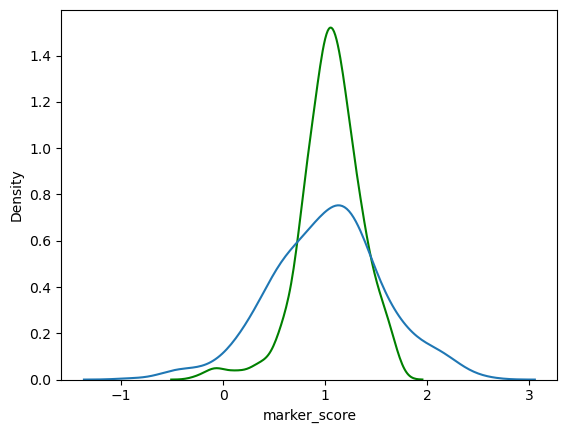

In [53]:
sb.kdeplot(y_pred, color = "g")
sb.kdeplot(y_test)

In [54]:
importances_cb = best_model_cb.feature_importances_
importances_cb = pd.Series(importances_cb, index=prot.columns)
importances_cb=importances_cb.sort_values(ascending=False)

print(importances_cb.head(10))

CD226    8.022950
CD16     6.796945
CD57     5.011608
CD54     4.095279
CD38     3.986079
CD7      3.449061
CD335    3.370366
CD162    3.035808
CD122    2.640171
CD94     2.106414
dtype: float64


In [55]:
#df from the top 20 important markers
importances_cb=pd.DataFrame(importances_cb)
importances_cb_top=importances_cb[0:20]
importances_cb_top=importances_cb_top.T

In [2]:
plt.figure(figsize=(20,10))
plt.ylim(0,20)
a=sb.barplot(data=importances_cb_top)

plt.title("Top-20 important markers for gene set defining proliferating NK cells (Catboost)", fontsize = 30) ;




NameError: name 'plt' is not defined

## 5. UMAP visualization

In [59]:
markers_prot = ['CD226', 'CD16', 'CD57', 'CD54', 'CD38', 'CD7', 'CD335', 'CD162', 'CD122', 'CD94']


In [60]:
#Computing a neighborhood of observations using latent space

sc.pp.neighbors(adata_neurips, use_rep="X_totalVI")   

sc.tl.umap(adata_neurips)

In [61]:
#selecting one sample from Neurips

sample =eg[eg.obs['POOL'] == "s4d1"].copy()


In [62]:
sample

AnnData object with n_obs × n_vars = 4885 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47_prot', 'CD48', 'CD40', 'CD154', 'CD52_prot', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD16

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


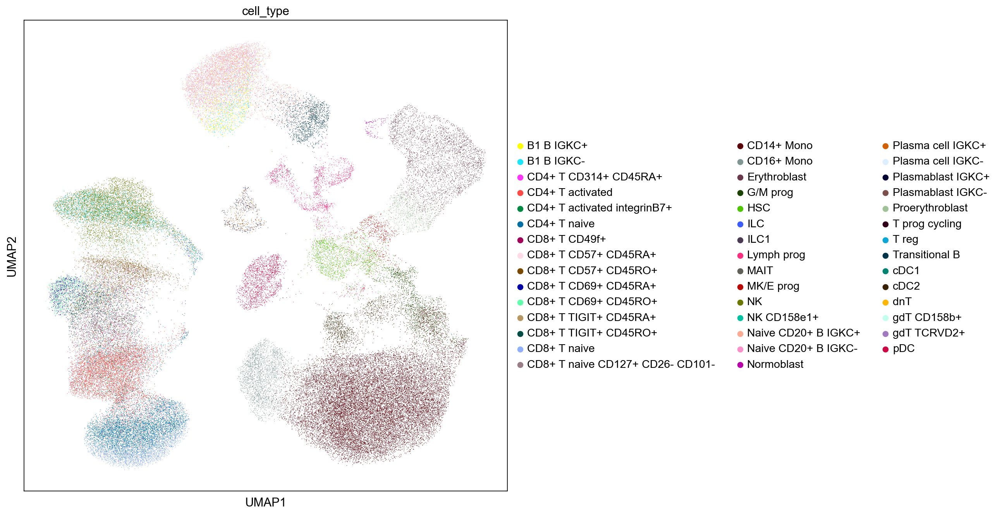

In [63]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_neurips, color = ['cell_type'])

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


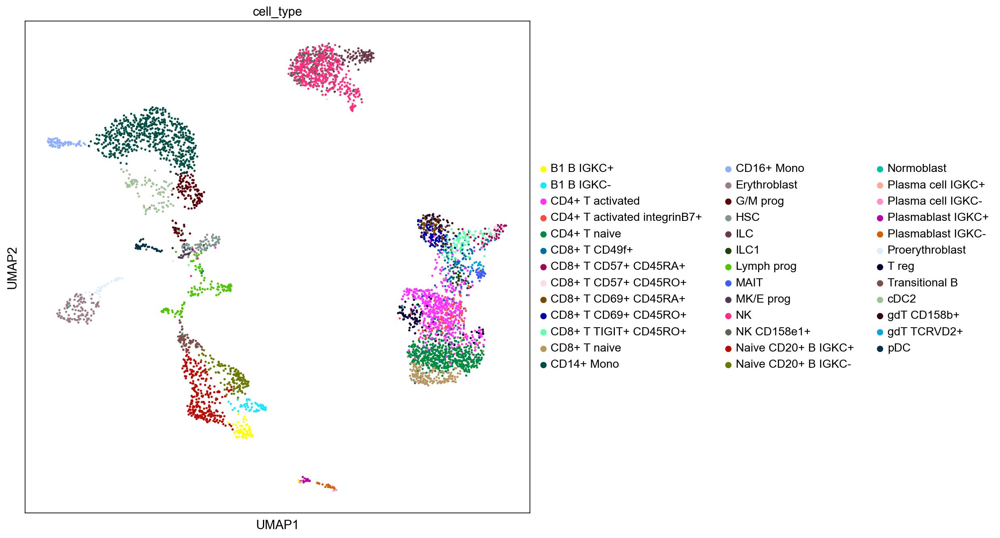

In [64]:
#only one sample

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(sample, color = ['cell_type'])

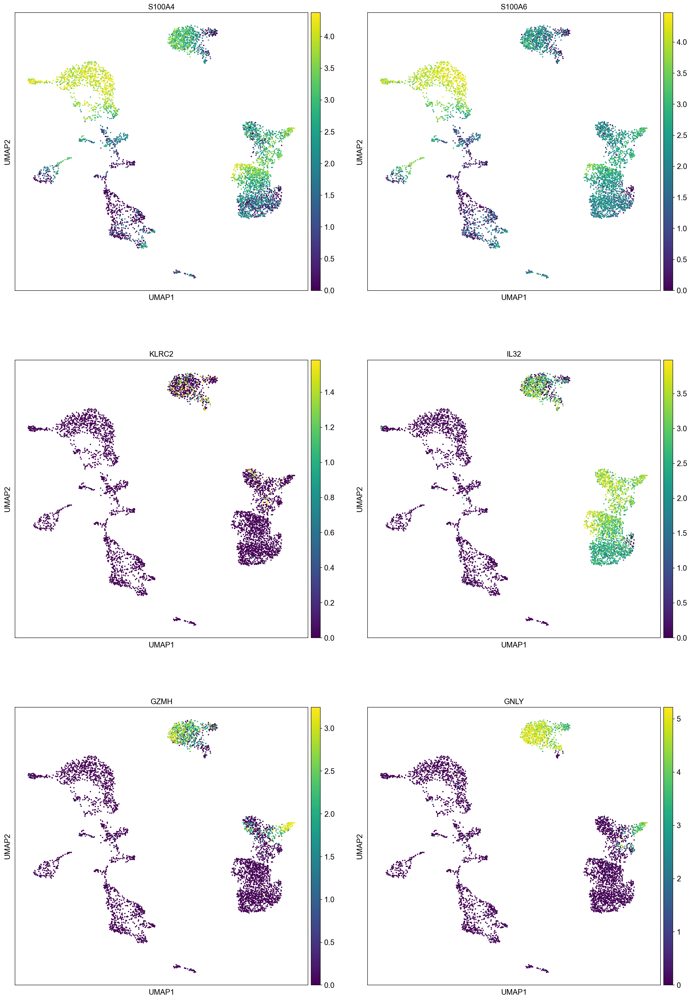

In [65]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(sample, color = markers,  vmax="p99", ncols = 2)

UMAPs above represent RNA markers for proliferating NK cells (according to Melsen et al., paper). 

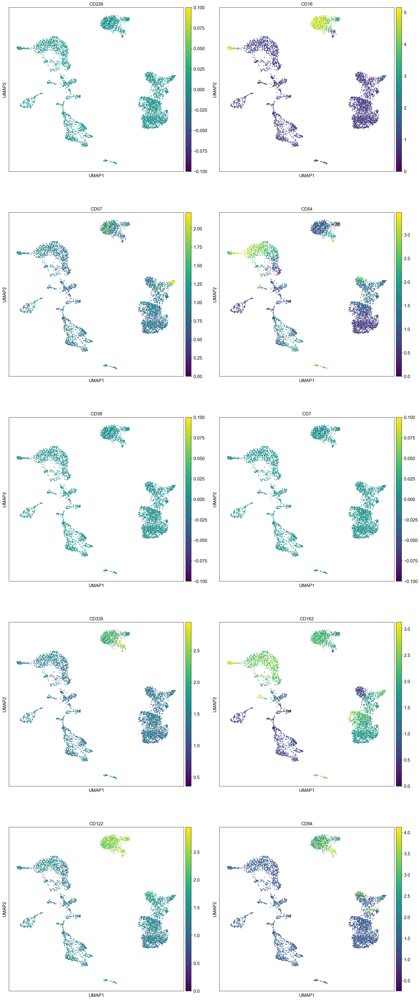

In [66]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(sample, color = markers_prot,  vmax="p99", ncols = 2)

Markers above are important features (surface proteins) identified by CatBoostReggressor. 